**Swin Factorizer, FedProx**

**Imports & Drive Mount**

In [1]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
# from monai.networks.nets import UNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [3]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [4]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [5]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints"
log_dir = "D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_logs"

Checkpoints will be saved to: D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints
TensorBoard logs will be saved to: D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_logs


Reusing TensorBoard on port 6008 (pid 14040), started 5 days, 23:46:03 ago. (Use '!kill 14040' to kill it.)

In [6]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

**MONAI Preprocessing Transforms**

In [7]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [8]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [9]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 40 | Image shape: (128, 128, 25) | Mask shape: (128, 128, 25) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


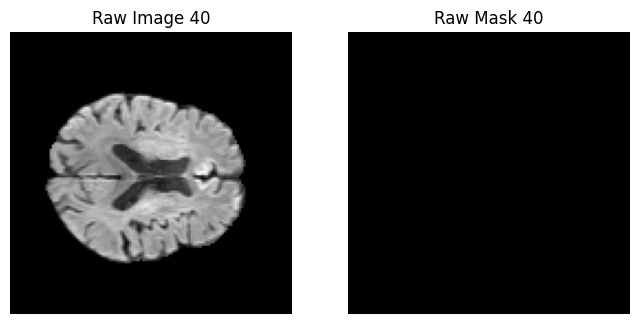

Sample 7 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


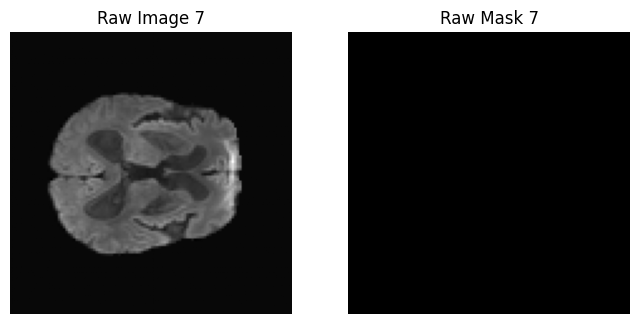

Client 0 - Preprocessed Samples:
Sample 40 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


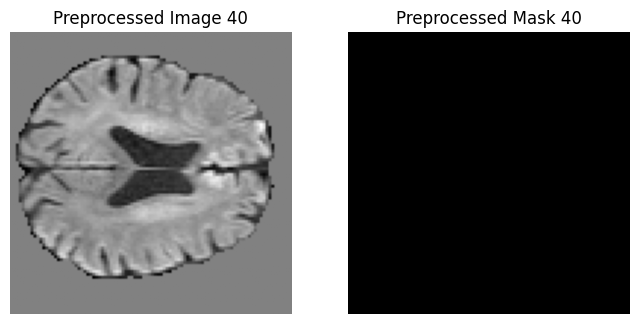

Sample 7 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


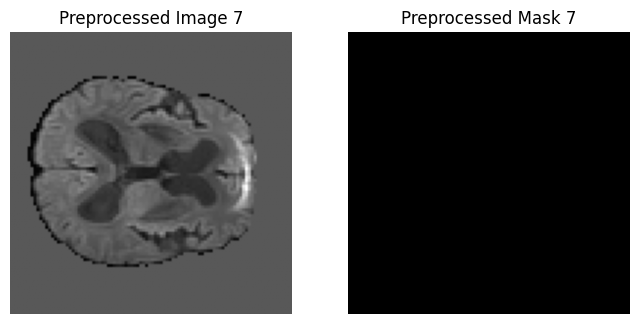

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 1 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


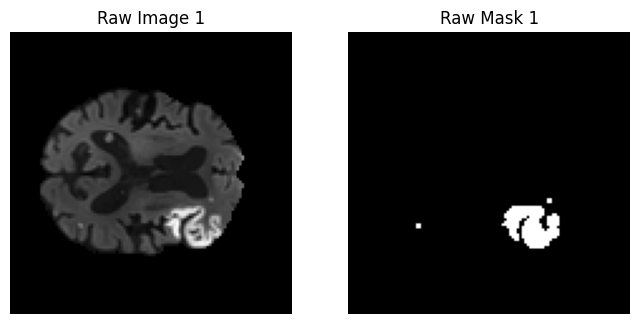

Sample 47 | Image shape: (192, 192, 30) | Mask shape: (192, 192, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


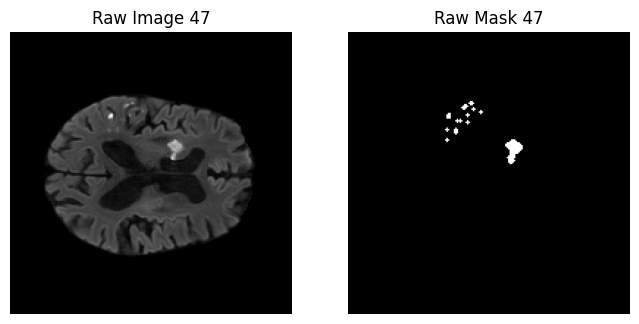

Client 1 - Preprocessed Samples:
Sample 1 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


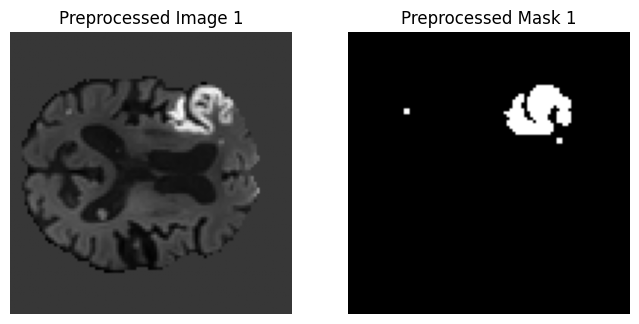

Sample 47 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


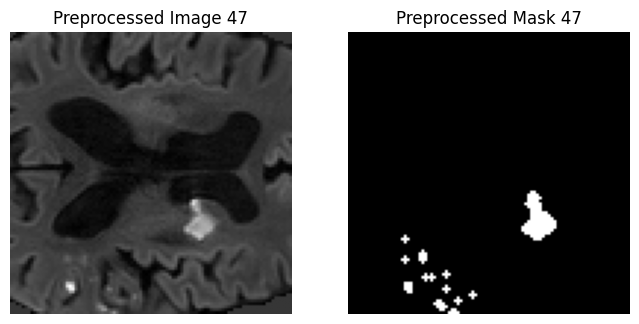

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 17 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


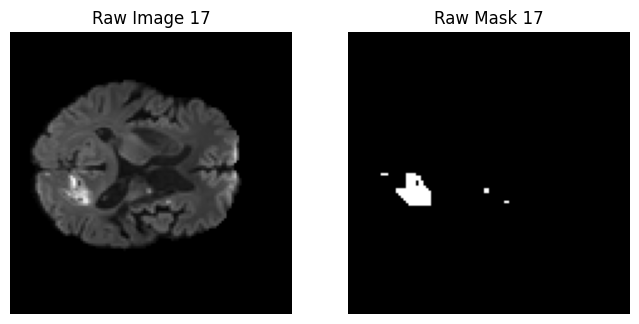

Sample 15 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


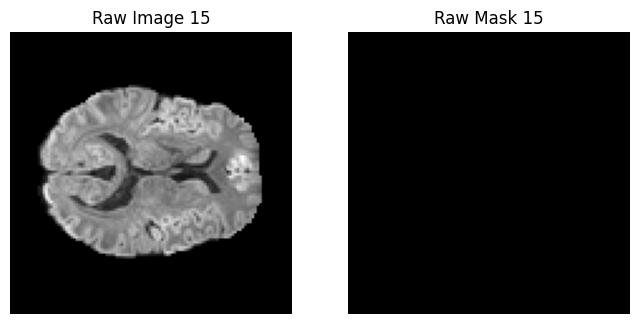

Client 2 - Preprocessed Samples:
Sample 17 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


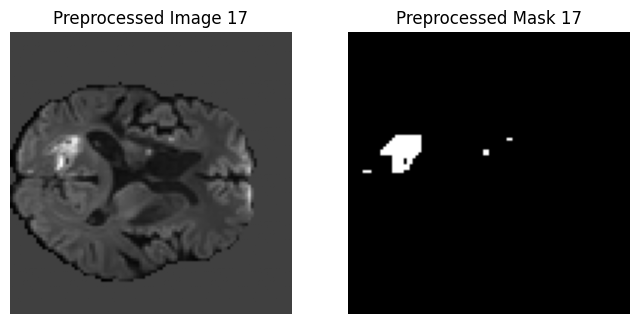

Sample 15 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


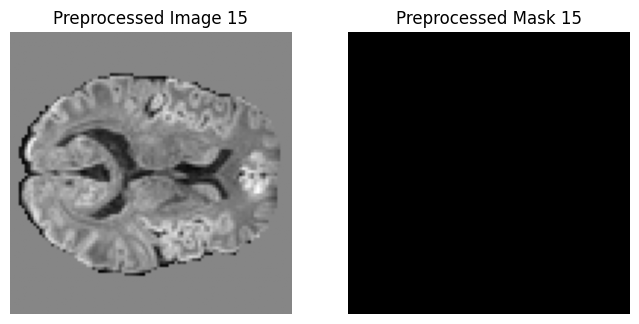

Client 2 samples: 50


In [10]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)
        
        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [11]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


Swin Factorizer

In [12]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [13]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


In [14]:
!pip install git+https://github.com/pashtari/factorizer.git

  Cloning https://github.com/pashtari/factorizer.git to C:\Users\LAB\AppData\Local\Temp\pip-req-build-jjywz7i7
  Resolved https://github.com/pashtari/factorizer.git to commit 9adcc5d3c5178d458f5720125ce450e7696f1e09
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'


  Running command git clone --filter=blob:none --quiet https://github.com/pashtari/factorizer.git 'C:\Users\LAB\AppData\Local\Temp\pip-req-build-jjywz7i7'


In [15]:
import factorizer as ft

In [16]:
def create_model():
    model = ft.Factorizer(
        in_channels=1,
        out_channels=1,
        spatial_size=target_shape,
        encoder_depth=(1, 1, 1, 1),
        encoder_width=(32, 64, 128, 256),
        strides=(1, 2, 2, 2, 2),
        decoder_depth=(1, 1, 1, 1),
        norm=ft.LayerNorm,
        reshape=(ft.SWMatricize, {'head_dim': 8, 'patch_size': 2}),
        act=nn.ReLU,
        factorize=ft.NMF, 
        rank=1,
        num_iters=3,
        init="uniform",
        solver="hals",
        mlp_ratio=2,
        dropout=0.1
    ).to(device)
    print(model)
    return model

**Client Class**

In [17]:
class Client:
    def __init__(self, client_id, dataset, device, mu=0.01):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        
        self.mu = mu   # FedProx coefficient
        
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0
        
        # store global parameters
        global_params = [param.clone().detach() for param in self.model.parameters()]

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)
                
                 # FedProx proximal term
                prox_term = 0.0
                for param, global_param in zip(self.model.parameters(), global_params):
                    prox_term += torch.norm(param - global_param) ** 2

                loss = loss + (self.mu / 2) * prox_term
                
                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0 
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics (or you can average them if you prefer)
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class**

In [18]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        new_params = copy.deepcopy(client_params_list[0])

        for key in new_params.keys():
            for i in range(1, len(client_params_list)):
                new_params[key] += client_params_list[i][key]
            new_params[key] /= len(client_params_list)

        self.global_model.load_state_dict(new_params)

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0 
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [19]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

Factorizer(
  (stem): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  (encoder): UNetEncoder(
    (blocks): ModuleList(
      (0): UNetEncoderBlock(
        (downsample): Identity()
        (block): FactorizerStage(
          (pos_embed): Identity()
          (blocks): ModuleList(
            (0): FactorizerBlock(
              (norm1): LayerNorm(
                (norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
              )
              (fact): FactMixer(
                (in_proj): Linear(
                  (flatten): Flatten(start_dim=2, end_dim=-1)
                  (linear): Conv1d(32, 32, kernel_size=(1,), stride=(1,), bias=False)
                )
                (reshape): SWMatricize(
                  (shifted_windows): ModuleList(
                    (0-1): 2 x Matricize(
                      (rearrange): Rearrange('b (h d) (g0 p0) (g1 p1) (g2 p2) -> (b h) (g0 g1 g2) d (p0 p1 p2)', d=8, p0=2, p1=2, p2=2)
                

**Federated Training loop**

In [20]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2  # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")
    
        # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------
    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8202 | Dice: 0.1736 | IoU: 0.0950 | HD95: 39.6613


Client 0 | Epoch 2/20 | Loss: 0.7288 | Dice: 0.2292 | IoU: 0.1294 | HD95: 35.6262


Client 0 | Epoch 3/20 | Loss: 0.6697 | Dice: 0.2338 | IoU: 0.1324 | HD95: 36.0877


Client 0 | Epoch 4/20 | Loss: 0.5856 | Dice: 0.2627 | IoU: 0.1512 | HD95: 36.4450


Client 0 | Epoch 5/20 | Loss: 0.5554 | Dice: 0.2758 | IoU: 0.1599 | HD95: 36.0940


Client 0 | Epoch 6/20 | Loss: 0.5388 | Dice: 0.2966 | IoU: 0.1741 | HD95: 35.7861


Client 0 | Epoch 7/20 | Loss: 0.5321 | Dice: 0.3085 | IoU: 0.1824 | HD95: 35.2373


Client 0 | Epoch 8/20 | Loss: 0.5264 | Dice: 0.3150 | IoU: 0.1869 | HD95: 35.2978


Client 0 | Epoch 9/20 | Loss: 0.5170 | Dice: 0.3339 | IoU: 0.2004 | HD95: 34.0330


Client 0 | Epoch 10/20 | Loss: 0.5052 | Dice: 0.3593 | IoU: 0.2190 | HD95: 32.3041


Client 0 | Epoch 11/20 | Loss: 0.4890 | Dice: 0.3978 | IoU: 0.2483 | HD95: 30.8044


Client 0 | Epoch 12/20 | Loss: 0.4783 | Dice: 0.4317 | IoU: 0.2753 | HD95: 25.6993


Client 0 | Epoch 13/20 | Loss: 0.4281 | Dice: 0.5207 | IoU: 0.3520 | HD95: 20.9151


Client 0 | Epoch 14/20 | Loss: 0.4265 | Dice: 0.5270 | IoU: 0.3578 | HD95: 19.4344


Client 0 | Epoch 15/20 | Loss: 0.4001 | Dice: 0.5757 | IoU: 0.4042 | HD95: 16.0403


Client 0 | Epoch 16/20 | Loss: 0.3820 | Dice: 0.6001 | IoU: 0.4286 | HD95: 13.7101


Client 0 | Epoch 17/20 | Loss: 0.3531 | Dice: 0.6393 | IoU: 0.4699 | HD95: 12.2208


Client 0 | Epoch 18/20 | Loss: 0.3490 | Dice: 0.6404 | IoU: 0.4710 | HD95: 12.7401


Client 0 | Epoch 19/20 | Loss: 0.3290 | Dice: 0.6684 | IoU: 0.5019 | HD95: 11.4108


Clients Training:  33%|███▎      | 1/3 [10:15<20:30, 615.28s/it]

Client 0 | Epoch 20/20 | Loss: 0.3362 | Dice: 0.6557 | IoU: 0.4878 | HD95: 10.0932
Client 0 | Loss=0.4975 | Dice=0.6557 | IoU=0.4878 | HD95=10.0932


Client 1 | Epoch 1/20 | Loss: 0.8193 | Dice: 0.1343 | IoU: 0.0720 | HD95: 38.3015


Client 1 | Epoch 2/20 | Loss: 0.7262 | Dice: 0.2586 | IoU: 0.1485 | HD95: 32.6121


Client 1 | Epoch 3/20 | Loss: 0.6619 | Dice: 0.2579 | IoU: 0.1481 | HD95: 34.0657


Client 1 | Epoch 4/20 | Loss: 0.5577 | Dice: 0.2991 | IoU: 0.1758 | HD95: 33.8880


Client 1 | Epoch 5/20 | Loss: 0.5259 | Dice: 0.3117 | IoU: 0.1846 | HD95: 33.9867


Client 1 | Epoch 6/20 | Loss: 0.5184 | Dice: 0.3253 | IoU: 0.1942 | HD95: 33.7464


Client 1 | Epoch 7/20 | Loss: 0.5209 | Dice: 0.3234 | IoU: 0.1929 | HD95: 33.4555


Client 1 | Epoch 8/20 | Loss: 0.5043 | Dice: 0.3489 | IoU: 0.2113 | HD95: 32.9467


Client 1 | Epoch 9/20 | Loss: 0.4866 | Dice: 0.3899 | IoU: 0.2422 | HD95: 29.6824


Client 1 | Epoch 10/20 | Loss: 0.4848 | Dice: 0.4055 | IoU: 0.2543 | HD95: 30.0606


Client 1 | Epoch 11/20 | Loss: 0.4499 | Dice: 0.4670 | IoU: 0.3046 | HD95: 25.4338


Client 1 | Epoch 12/20 | Loss: 0.4050 | Dice: 0.5438 | IoU: 0.3734 | HD95: 19.3270


Client 1 | Epoch 13/20 | Loss: 0.4092 | Dice: 0.5360 | IoU: 0.3661 | HD95: 18.3350


Client 1 | Epoch 14/20 | Loss: 0.3882 | Dice: 0.5730 | IoU: 0.4016 | HD95: 17.7018


Client 1 | Epoch 15/20 | Loss: 0.3729 | Dice: 0.5972 | IoU: 0.4257 | HD95: 14.8387


Client 1 | Epoch 16/20 | Loss: 0.3567 | Dice: 0.6207 | IoU: 0.4500 | HD95: 16.3581


Client 1 | Epoch 17/20 | Loss: 0.3378 | Dice: 0.6439 | IoU: 0.4748 | HD95: 15.5462


Client 1 | Epoch 18/20 | Loss: 0.3405 | Dice: 0.6409 | IoU: 0.4716 | HD95: 11.5038


Client 1 | Epoch 19/20 | Loss: 0.3232 | Dice: 0.6622 | IoU: 0.4950 | HD95: 12.3315


Clients Training:  67%|██████▋   | 2/3 [20:30<10:15, 615.36s/it]

Client 1 | Epoch 20/20 | Loss: 0.3189 | Dice: 0.6685 | IoU: 0.5020 | HD95: 12.8205
Client 1 | Loss=0.4754 | Dice=0.6685 | IoU=0.5020 | HD95=12.8205


Client 2 | Epoch 1/20 | Loss: 0.8162 | Dice: 0.2036 | IoU: 0.1133 | HD95: 38.6707


Client 2 | Epoch 2/20 | Loss: 0.7202 | Dice: 0.3194 | IoU: 0.1901 | HD95: 35.2944


Client 2 | Epoch 3/20 | Loss: 0.6301 | Dice: 0.3175 | IoU: 0.1887 | HD95: 36.6007


Client 2 | Epoch 4/20 | Loss: 0.5065 | Dice: 0.3602 | IoU: 0.2197 | HD95: 34.8028


Client 2 | Epoch 5/20 | Loss: 0.4938 | Dice: 0.3585 | IoU: 0.2184 | HD95: 35.3157


Client 2 | Epoch 6/20 | Loss: 0.4952 | Dice: 0.3536 | IoU: 0.2148 | HD95: 33.9066


Client 2 | Epoch 7/20 | Loss: 0.4825 | Dice: 0.3727 | IoU: 0.2290 | HD95: 34.1754


Client 2 | Epoch 8/20 | Loss: 0.4736 | Dice: 0.3850 | IoU: 0.2384 | HD95: 36.0261


Client 2 | Epoch 9/20 | Loss: 0.4798 | Dice: 0.3770 | IoU: 0.2323 | HD95: 33.3474


Client 2 | Epoch 10/20 | Loss: 0.4695 | Dice: 0.3933 | IoU: 0.2448 | HD95: 34.0010


Client 2 | Epoch 11/20 | Loss: 0.4684 | Dice: 0.4058 | IoU: 0.2546 | HD95: 32.2663


Client 2 | Epoch 12/20 | Loss: 0.4442 | Dice: 0.4500 | IoU: 0.2904 | HD95: 30.8543


Client 2 | Epoch 13/20 | Loss: 0.4224 | Dice: 0.4897 | IoU: 0.3243 | HD95: 29.6089


Client 2 | Epoch 14/20 | Loss: 0.4059 | Dice: 0.5224 | IoU: 0.3535 | HD95: 22.4540


Client 2 | Epoch 15/20 | Loss: 0.3929 | Dice: 0.5468 | IoU: 0.3763 | HD95: 23.3304


Client 2 | Epoch 16/20 | Loss: 0.3746 | Dice: 0.5768 | IoU: 0.4053 | HD95: 19.0050


Client 2 | Epoch 17/20 | Loss: 0.3666 | Dice: 0.5906 | IoU: 0.4191 | HD95: 17.0555


Client 2 | Epoch 18/20 | Loss: 0.3693 | Dice: 0.5973 | IoU: 0.4258 | HD95: 17.1503


Client 2 | Epoch 19/20 | Loss: 0.3494 | Dice: 0.6257 | IoU: 0.4553 | HD95: 15.5646


Client 2 Epochs: 100%|██████████| 20/20 [10:14<00:00, 30.75s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.3296 | Dice: 0.6551 | IoU: 0.4871 | HD95: 12.8858
Client 2 | Loss=0.4745 | Dice=0.6551 | IoU=0.4871 | HD95=12.8858


Best global model updated with Dice=0.5702
Global | Val Loss=0.3175 | Dice=0.5702 | IoU=0.3988 | HD95=18.1278
Checkpoint saved for round 1 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2950 | Dice: 0.6100 | IoU: 0.4388 | HD95: 15.1750


Client 0 | Epoch 2/20 | Loss: 0.2814 | Dice: 0.6372 | IoU: 0.4675 | HD95: 16.9712


Client 0 | Epoch 3/20 | Loss: 0.3396 | Dice: 0.5654 | IoU: 0.3941 | HD95: 18.1105


Client 0 | Epoch 4/20 | Loss: 0.3088 | Dice: 0.6192 | IoU: 0.4485 | HD95: 13.7326


Client 0 | Epoch 5/20 | Loss: 0.2795 | Dice: 0.6605 | IoU: 0.4930 | HD95: 13.4631


Client 0 | Epoch 6/20 | Loss: 0.2719 | Dice: 0.6767 | IoU: 0.5114 | HD95: 12.8388


Client 0 | Epoch 7/20 | Loss: 0.2395 | Dice: 0.7191 | IoU: 0.5614 | HD95: 8.6334


Client 0 | Epoch 8/20 | Loss: 0.2329 | Dice: 0.7274 | IoU: 0.5715 | HD95: 8.8795


Client 0 | Epoch 9/20 | Loss: 0.2655 | Dice: 0.6778 | IoU: 0.5126 | HD95: 11.6761


Client 0 | Epoch 10/20 | Loss: 0.2388 | Dice: 0.7216 | IoU: 0.5645 | HD95: 10.3613


Client 0 | Epoch 11/20 | Loss: 0.2251 | Dice: 0.7383 | IoU: 0.5852 | HD95: 8.5410


Client 0 | Epoch 12/20 | Loss: 0.2131 | Dice: 0.7555 | IoU: 0.6071 | HD95: 7.5277


Client 0 | Epoch 13/20 | Loss: 0.2065 | Dice: 0.7629 | IoU: 0.6167 | HD95: 7.1383


Client 0 | Epoch 14/20 | Loss: 0.2038 | Dice: 0.7673 | IoU: 0.6224 | HD95: 7.5515


Client 0 | Epoch 15/20 | Loss: 0.2025 | Dice: 0.7672 | IoU: 0.6223 | HD95: 8.7417


Client 0 | Epoch 16/20 | Loss: 0.2046 | Dice: 0.7686 | IoU: 0.6242 | HD95: 7.4651


Client 0 | Epoch 17/20 | Loss: 0.1979 | Dice: 0.7762 | IoU: 0.6342 | HD95: 7.1378


Client 0 | Epoch 18/20 | Loss: 0.1954 | Dice: 0.7780 | IoU: 0.6367 | HD95: 7.9152


Client 0 | Epoch 19/20 | Loss: 0.2179 | Dice: 0.7486 | IoU: 0.5982 | HD95: 11.2808


Clients Training:  33%|███▎      | 1/3 [10:07<20:15, 607.53s/it]

Client 0 | Epoch 20/20 | Loss: 0.2120 | Dice: 0.7579 | IoU: 0.6102 | HD95: 7.5570
Client 0 | Loss=0.2416 | Dice=0.7579 | IoU=0.6102 | HD95=7.5570


Client 1 | Epoch 1/20 | Loss: 0.3126 | Dice: 0.5728 | IoU: 0.4013 | HD95: 18.6083


Client 1 | Epoch 2/20 | Loss: 0.2746 | Dice: 0.6341 | IoU: 0.4643 | HD95: 14.7615


Client 1 | Epoch 3/20 | Loss: 0.2554 | Dice: 0.6662 | IoU: 0.4994 | HD95: 13.8198


Client 1 | Epoch 4/20 | Loss: 0.2397 | Dice: 0.6881 | IoU: 0.5244 | HD95: 12.8813


Client 1 | Epoch 5/20 | Loss: 0.2743 | Dice: 0.6427 | IoU: 0.4735 | HD95: 13.3041


Client 1 | Epoch 6/20 | Loss: 0.2557 | Dice: 0.6731 | IoU: 0.5073 | HD95: 11.8923


Client 1 | Epoch 7/20 | Loss: 0.2340 | Dice: 0.7040 | IoU: 0.5432 | HD95: 11.1752


Client 1 | Epoch 8/20 | Loss: 0.2141 | Dice: 0.7302 | IoU: 0.5750 | HD95: 9.7085


Client 1 | Epoch 9/20 | Loss: 0.2128 | Dice: 0.7311 | IoU: 0.5762 | HD95: 10.0528


Client 1 | Epoch 10/20 | Loss: 0.2130 | Dice: 0.7309 | IoU: 0.5760 | HD95: 9.4456


Client 1 | Epoch 11/20 | Loss: 0.2289 | Dice: 0.7111 | IoU: 0.5517 | HD95: 10.4972


Client 1 | Epoch 12/20 | Loss: 0.2322 | Dice: 0.7116 | IoU: 0.5523 | HD95: 10.9183


Client 1 | Epoch 13/20 | Loss: 0.2258 | Dice: 0.7221 | IoU: 0.5651 | HD95: 9.5344


Client 1 | Epoch 14/20 | Loss: 0.2133 | Dice: 0.7388 | IoU: 0.5858 | HD95: 8.6384


Client 1 | Epoch 15/20 | Loss: 0.2056 | Dice: 0.7478 | IoU: 0.5972 | HD95: 8.1249


Client 1 | Epoch 16/20 | Loss: 0.2063 | Dice: 0.7498 | IoU: 0.5998 | HD95: 8.4821


Client 1 | Epoch 17/20 | Loss: 0.1906 | Dice: 0.7700 | IoU: 0.6261 | HD95: 8.1635


Client 1 | Epoch 18/20 | Loss: 0.1846 | Dice: 0.7780 | IoU: 0.6366 | HD95: 8.5347


Client 1 | Epoch 19/20 | Loss: 0.1970 | Dice: 0.7572 | IoU: 0.6093 | HD95: 8.6585


Clients Training:  67%|██████▋   | 2/3 [20:16<10:08, 608.56s/it]

Client 1 | Epoch 20/20 | Loss: 0.1889 | Dice: 0.7718 | IoU: 0.6283 | HD95: 7.7441
Client 1 | Loss=0.2280 | Dice=0.7718 | IoU=0.6283 | HD95=7.7441


Client 2 | Epoch 1/20 | Loss: 0.3125 | Dice: 0.5686 | IoU: 0.3972 | HD95: 19.8624


Client 2 | Epoch 2/20 | Loss: 0.2688 | Dice: 0.6410 | IoU: 0.4717 | HD95: 13.2515


Client 2 | Epoch 3/20 | Loss: 0.2941 | Dice: 0.6183 | IoU: 0.4475 | HD95: 13.3742


Client 2 | Epoch 4/20 | Loss: 0.2616 | Dice: 0.6643 | IoU: 0.4973 | HD95: 13.9071


Client 2 | Epoch 5/20 | Loss: 0.2367 | Dice: 0.6989 | IoU: 0.5371 | HD95: 11.6015


Client 2 | Epoch 6/20 | Loss: 0.2700 | Dice: 0.6586 | IoU: 0.4909 | HD95: 12.2695


Client 2 | Epoch 7/20 | Loss: 0.2746 | Dice: 0.6548 | IoU: 0.4868 | HD95: 14.1160


Client 2 | Epoch 8/20 | Loss: 0.2702 | Dice: 0.6647 | IoU: 0.4978 | HD95: 15.6895


Client 2 | Epoch 9/20 | Loss: 0.2716 | Dice: 0.6703 | IoU: 0.5041 | HD95: 11.1236


Client 2 | Epoch 10/20 | Loss: 0.2387 | Dice: 0.7171 | IoU: 0.5589 | HD95: 10.9789


Client 2 | Epoch 11/20 | Loss: 0.2347 | Dice: 0.7207 | IoU: 0.5634 | HD95: 10.3399


Client 2 | Epoch 12/20 | Loss: 0.2234 | Dice: 0.7378 | IoU: 0.5845 | HD95: 9.1877


Client 2 | Epoch 13/20 | Loss: 0.2114 | Dice: 0.7514 | IoU: 0.6017 | HD95: 8.2220


Client 2 | Epoch 14/20 | Loss: 0.2036 | Dice: 0.7608 | IoU: 0.6140 | HD95: 7.0648


Client 2 | Epoch 15/20 | Loss: 0.2135 | Dice: 0.7453 | IoU: 0.5940 | HD95: 9.4847


Client 2 | Epoch 16/20 | Loss: 0.2185 | Dice: 0.7434 | IoU: 0.5916 | HD95: 9.4632


Client 2 | Epoch 17/20 | Loss: 0.2297 | Dice: 0.7323 | IoU: 0.5777 | HD95: 10.9850


Client 2 | Epoch 18/20 | Loss: 0.2070 | Dice: 0.7631 | IoU: 0.6170 | HD95: 7.5807


Client 2 | Epoch 19/20 | Loss: 0.1949 | Dice: 0.7780 | IoU: 0.6367 | HD95: 6.8045


Client 2 Epochs: 100%|██████████| 20/20 [10:09<00:00, 30.46s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1881 | Dice: 0.7853 | IoU: 0.6464 | HD95: 6.2068
Client 2 | Loss=0.2412 | Dice=0.7853 | IoU=0.6464 | HD95=6.2068


Best global model updated with Dice=0.6487
Global | Val Loss=0.2578 | Dice=0.6487 | IoU=0.4800 | HD95=16.7300
Checkpoint saved for round 2 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2124 | Dice: 0.7252 | IoU: 0.5689 | HD95: 11.8818


Client 0 | Epoch 2/20 | Loss: 0.2028 | Dice: 0.7442 | IoU: 0.5926 | HD95: 10.2674


Client 0 | Epoch 3/20 | Loss: 0.1942 | Dice: 0.7581 | IoU: 0.6104 | HD95: 8.5204


Client 0 | Epoch 4/20 | Loss: 0.1890 | Dice: 0.7669 | IoU: 0.6220 | HD95: 8.7558


Client 0 | Epoch 5/20 | Loss: 0.1846 | Dice: 0.7732 | IoU: 0.6303 | HD95: 7.2581


Client 0 | Epoch 6/20 | Loss: 0.1908 | Dice: 0.7639 | IoU: 0.6180 | HD95: 6.4150


Client 0 | Epoch 7/20 | Loss: 0.2006 | Dice: 0.7568 | IoU: 0.6087 | HD95: 10.1676


Client 0 | Epoch 8/20 | Loss: 0.2032 | Dice: 0.7597 | IoU: 0.6125 | HD95: 8.7356


Client 0 | Epoch 9/20 | Loss: 0.1842 | Dice: 0.7838 | IoU: 0.6445 | HD95: 5.7359


Client 0 | Epoch 10/20 | Loss: 0.1833 | Dice: 0.7844 | IoU: 0.6453 | HD95: 5.6514


Client 0 | Epoch 11/20 | Loss: 0.1789 | Dice: 0.7905 | IoU: 0.6535 | HD95: 5.8031


Client 0 | Epoch 12/20 | Loss: 0.1720 | Dice: 0.7998 | IoU: 0.6664 | HD95: 4.5526


Client 0 | Epoch 13/20 | Loss: 0.1721 | Dice: 0.7984 | IoU: 0.6644 | HD95: 5.9396


Client 0 | Epoch 14/20 | Loss: 0.1854 | Dice: 0.7833 | IoU: 0.6438 | HD95: 7.0089


Client 0 | Epoch 15/20 | Loss: 0.1899 | Dice: 0.7799 | IoU: 0.6392 | HD95: 6.4891


Client 0 | Epoch 16/20 | Loss: 0.1762 | Dice: 0.7995 | IoU: 0.6660 | HD95: 5.8835


Client 0 | Epoch 17/20 | Loss: 0.1923 | Dice: 0.7760 | IoU: 0.6340 | HD95: 6.3175


Client 0 | Epoch 18/20 | Loss: 0.1923 | Dice: 0.7802 | IoU: 0.6396 | HD95: 7.0537


Client 0 | Epoch 19/20 | Loss: 0.1760 | Dice: 0.8008 | IoU: 0.6678 | HD95: 5.7720


Clients Training:  33%|███▎      | 1/3 [10:06<20:12, 606.31s/it]

Client 0 | Epoch 20/20 | Loss: 0.1675 | Dice: 0.8118 | IoU: 0.6833 | HD95: 6.1191
Client 0 | Loss=0.1874 | Dice=0.8118 | IoU=0.6833 | HD95=6.1191


Client 1 | Epoch 1/20 | Loss: 0.2725 | Dice: 0.6284 | IoU: 0.4582 | HD95: 17.0645


Client 1 | Epoch 2/20 | Loss: 0.2558 | Dice: 0.6646 | IoU: 0.4977 | HD95: 13.0982


Client 1 | Epoch 3/20 | Loss: 0.2196 | Dice: 0.7163 | IoU: 0.5580 | HD95: 9.9292


Client 1 | Epoch 4/20 | Loss: 0.2012 | Dice: 0.7436 | IoU: 0.5918 | HD95: 8.2368


Client 1 | Epoch 5/20 | Loss: 0.2658 | Dice: 0.6662 | IoU: 0.4995 | HD95: 13.8166


Client 1 | Epoch 6/20 | Loss: 0.2471 | Dice: 0.6960 | IoU: 0.5337 | HD95: 11.9707


Client 1 | Epoch 7/20 | Loss: 0.2219 | Dice: 0.7306 | IoU: 0.5755 | HD95: 9.8062


Client 1 | Epoch 8/20 | Loss: 0.1975 | Dice: 0.7632 | IoU: 0.6171 | HD95: 7.9105


Client 1 | Epoch 9/20 | Loss: 0.1939 | Dice: 0.7687 | IoU: 0.6243 | HD95: 8.3009


Client 1 | Epoch 10/20 | Loss: 0.1890 | Dice: 0.7741 | IoU: 0.6315 | HD95: 8.6549


Client 1 | Epoch 11/20 | Loss: 0.1877 | Dice: 0.7748 | IoU: 0.6324 | HD95: 8.0706


Client 1 | Epoch 12/20 | Loss: 0.1874 | Dice: 0.7744 | IoU: 0.6319 | HD95: 7.6513


Client 1 | Epoch 13/20 | Loss: 0.1754 | Dice: 0.7896 | IoU: 0.6524 | HD95: 7.7667


Client 1 | Epoch 14/20 | Loss: 0.1698 | Dice: 0.7959 | IoU: 0.6609 | HD95: 6.9309


Client 1 | Epoch 15/20 | Loss: 0.1680 | Dice: 0.7971 | IoU: 0.6626 | HD95: 6.0024


Client 1 | Epoch 16/20 | Loss: 0.1645 | Dice: 0.8009 | IoU: 0.6680 | HD95: 6.4036


Client 1 | Epoch 17/20 | Loss: 0.1619 | Dice: 0.8038 | IoU: 0.6720 | HD95: 6.5148


Client 1 | Epoch 18/20 | Loss: 0.1624 | Dice: 0.8022 | IoU: 0.6698 | HD95: 5.9778


Client 1 | Epoch 19/20 | Loss: 0.1663 | Dice: 0.7961 | IoU: 0.6613 | HD95: 7.2272


Clients Training:  67%|██████▋   | 2/3 [20:18<10:09, 609.51s/it]

Client 1 | Epoch 20/20 | Loss: 0.2047 | Dice: 0.7490 | IoU: 0.5987 | HD95: 7.8934
Client 1 | Loss=0.2006 | Dice=0.7490 | IoU=0.5987 | HD95=7.8934


Client 2 | Epoch 1/20 | Loss: 0.2170 | Dice: 0.7015 | IoU: 0.5403 | HD95: 13.0362


Client 2 | Epoch 2/20 | Loss: 0.2322 | Dice: 0.6889 | IoU: 0.5254 | HD95: 12.2607


Client 2 | Epoch 3/20 | Loss: 0.2006 | Dice: 0.7390 | IoU: 0.5861 | HD95: 9.5509


Client 2 | Epoch 4/20 | Loss: 0.2273 | Dice: 0.7020 | IoU: 0.5408 | HD95: 10.2121


Client 2 | Epoch 5/20 | Loss: 0.2015 | Dice: 0.7446 | IoU: 0.5931 | HD95: 9.1974


Client 2 | Epoch 6/20 | Loss: 0.1866 | Dice: 0.7640 | IoU: 0.6182 | HD95: 10.0047


Client 2 | Epoch 7/20 | Loss: 0.1854 | Dice: 0.7676 | IoU: 0.6228 | HD95: 7.6203


Client 2 | Epoch 8/20 | Loss: 0.1768 | Dice: 0.7797 | IoU: 0.6390 | HD95: 7.3844


Client 2 | Epoch 9/20 | Loss: 0.1780 | Dice: 0.7755 | IoU: 0.6333 | HD95: 7.8466


Client 2 | Epoch 10/20 | Loss: 0.1743 | Dice: 0.7818 | IoU: 0.6418 | HD95: 9.7218


Client 2 | Epoch 11/20 | Loss: 0.1730 | Dice: 0.7839 | IoU: 0.6447 | HD95: 6.4917


Client 2 | Epoch 12/20 | Loss: 0.1626 | Dice: 0.7980 | IoU: 0.6638 | HD95: 6.8328


Client 2 | Epoch 13/20 | Loss: 0.1628 | Dice: 0.7962 | IoU: 0.6614 | HD95: 6.5509


Client 2 | Epoch 14/20 | Loss: 0.1625 | Dice: 0.7971 | IoU: 0.6626 | HD95: 6.0175


Client 2 | Epoch 15/20 | Loss: 0.1656 | Dice: 0.7929 | IoU: 0.6569 | HD95: 6.5820


Client 2 | Epoch 16/20 | Loss: 0.1522 | Dice: 0.8124 | IoU: 0.6841 | HD95: 6.4668


Client 2 | Epoch 17/20 | Loss: 0.1474 | Dice: 0.8174 | IoU: 0.6912 | HD95: 5.4593


Client 2 | Epoch 18/20 | Loss: 0.1491 | Dice: 0.8165 | IoU: 0.6899 | HD95: 5.2841


Client 2 | Epoch 19/20 | Loss: 0.1615 | Dice: 0.8007 | IoU: 0.6676 | HD95: 7.6701


Client 2 Epochs: 100%|██████████| 20/20 [10:10<00:00, 30.51s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1589 | Dice: 0.8050 | IoU: 0.6737 | HD95: 5.3631
Client 2 | Loss=0.1788 | Dice=0.8050 | IoU=0.6737 | HD95=5.3631


Best global model updated with Dice=0.6765
Global | Val Loss=0.2382 | Dice=0.6765 | IoU=0.5112 | HD95=12.7855
Checkpoint saved for round 3 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1826 | Dice: 0.7671 | IoU: 0.6221 | HD95: 8.2845


Client 0 | Epoch 2/20 | Loss: 0.1803 | Dice: 0.7739 | IoU: 0.6311 | HD95: 6.3961


Client 0 | Epoch 3/20 | Loss: 0.2011 | Dice: 0.7458 | IoU: 0.5946 | HD95: 7.8872


Client 0 | Epoch 4/20 | Loss: 0.1884 | Dice: 0.7691 | IoU: 0.6248 | HD95: 10.6168


Client 0 | Epoch 5/20 | Loss: 0.1788 | Dice: 0.7860 | IoU: 0.6475 | HD95: 6.5050


Client 0 | Epoch 6/20 | Loss: 0.1989 | Dice: 0.7579 | IoU: 0.6102 | HD95: 8.6171


Client 0 | Epoch 7/20 | Loss: 0.1702 | Dice: 0.7985 | IoU: 0.6646 | HD95: 7.6272


Client 0 | Epoch 8/20 | Loss: 0.1769 | Dice: 0.7895 | IoU: 0.6522 | HD95: 7.4648


Client 0 | Epoch 9/20 | Loss: 0.1680 | Dice: 0.8021 | IoU: 0.6696 | HD95: 5.8209


Client 0 | Epoch 10/20 | Loss: 0.1637 | Dice: 0.8090 | IoU: 0.6792 | HD95: 6.3207


Client 0 | Epoch 11/20 | Loss: 0.1623 | Dice: 0.8110 | IoU: 0.6821 | HD95: 4.6692


Client 0 | Epoch 12/20 | Loss: 0.1590 | Dice: 0.8159 | IoU: 0.6891 | HD95: 4.5196


Client 0 | Epoch 13/20 | Loss: 0.1548 | Dice: 0.8204 | IoU: 0.6955 | HD95: 5.2065


Client 0 | Epoch 14/20 | Loss: 0.1489 | Dice: 0.8274 | IoU: 0.7057 | HD95: 5.3350


Client 0 | Epoch 15/20 | Loss: 0.1470 | Dice: 0.8294 | IoU: 0.7085 | HD95: 5.1064


Client 0 | Epoch 16/20 | Loss: 0.1529 | Dice: 0.8209 | IoU: 0.6962 | HD95: 5.0865


Client 0 | Epoch 17/20 | Loss: 0.1843 | Dice: 0.7811 | IoU: 0.6408 | HD95: 9.5562


Client 0 | Epoch 18/20 | Loss: 0.2023 | Dice: 0.7699 | IoU: 0.6259 | HD95: 7.7960


Client 0 | Epoch 19/20 | Loss: 0.1775 | Dice: 0.8051 | IoU: 0.6738 | HD95: 7.0043


Clients Training:  33%|███▎      | 1/3 [10:06<20:12, 606.18s/it]

Client 0 | Epoch 20/20 | Loss: 0.1714 | Dice: 0.8134 | IoU: 0.6855 | HD95: 6.7100
Client 0 | Loss=0.1735 | Dice=0.8134 | IoU=0.6855 | HD95=6.7100


Client 1 | Epoch 1/20 | Loss: 0.1828 | Dice: 0.7475 | IoU: 0.5967 | HD95: 8.4095


Client 1 | Epoch 2/20 | Loss: 0.1695 | Dice: 0.7700 | IoU: 0.6260 | HD95: 8.6918


Client 1 | Epoch 3/20 | Loss: 0.1685 | Dice: 0.7715 | IoU: 0.6280 | HD95: 7.2739


Client 1 | Epoch 4/20 | Loss: 0.1553 | Dice: 0.7917 | IoU: 0.6552 | HD95: 6.8095


Client 1 | Epoch 5/20 | Loss: 0.1540 | Dice: 0.7942 | IoU: 0.6587 | HD95: 6.5900


Client 1 | Epoch 6/20 | Loss: 0.1503 | Dice: 0.7990 | IoU: 0.6653 | HD95: 7.0517


Client 1 | Epoch 7/20 | Loss: 0.1632 | Dice: 0.7815 | IoU: 0.6413 | HD95: 8.3530


Client 1 | Epoch 8/20 | Loss: 0.1938 | Dice: 0.7444 | IoU: 0.5929 | HD95: 9.3814


Client 1 | Epoch 9/20 | Loss: 0.1807 | Dice: 0.7678 | IoU: 0.6230 | HD95: 9.3281


Client 1 | Epoch 10/20 | Loss: 0.1593 | Dice: 0.7982 | IoU: 0.6641 | HD95: 5.9228


Client 1 | Epoch 11/20 | Loss: 0.1588 | Dice: 0.7970 | IoU: 0.6625 | HD95: 5.9466


Client 1 | Epoch 12/20 | Loss: 0.1525 | Dice: 0.8063 | IoU: 0.6755 | HD95: 5.6849


Client 1 | Epoch 13/20 | Loss: 0.1485 | Dice: 0.8117 | IoU: 0.6831 | HD95: 5.9900


Client 1 | Epoch 14/20 | Loss: 0.1468 | Dice: 0.8137 | IoU: 0.6859 | HD95: 5.7859


Client 1 | Epoch 15/20 | Loss: 0.1460 | Dice: 0.8143 | IoU: 0.6868 | HD95: 5.7955


Client 1 | Epoch 16/20 | Loss: 0.1483 | Dice: 0.8127 | IoU: 0.6844 | HD95: 6.2188


Client 1 | Epoch 17/20 | Loss: 0.1409 | Dice: 0.8228 | IoU: 0.6989 | HD95: 5.3836


Client 1 | Epoch 18/20 | Loss: 0.1388 | Dice: 0.8253 | IoU: 0.7025 | HD95: 5.8119


Client 1 | Epoch 19/20 | Loss: 0.1344 | Dice: 0.8306 | IoU: 0.7102 | HD95: 5.7225


Clients Training:  67%|██████▋   | 2/3 [20:15<10:07, 607.99s/it]

Client 1 | Epoch 20/20 | Loss: 0.1381 | Dice: 0.8260 | IoU: 0.7035 | HD95: 6.4984
Client 1 | Loss=0.1565 | Dice=0.8260 | IoU=0.7035 | HD95=6.4984


Client 2 | Epoch 1/20 | Loss: 0.1730 | Dice: 0.7612 | IoU: 0.6144 | HD95: 8.5047


Client 2 | Epoch 2/20 | Loss: 0.1872 | Dice: 0.7453 | IoU: 0.5941 | HD95: 9.1390


Client 2 | Epoch 3/20 | Loss: 0.2256 | Dice: 0.7035 | IoU: 0.5426 | HD95: 13.7760


Client 2 | Epoch 4/20 | Loss: 0.2086 | Dice: 0.7313 | IoU: 0.5764 | HD95: 12.7587


Client 2 | Epoch 5/20 | Loss: 0.1803 | Dice: 0.7725 | IoU: 0.6293 | HD95: 6.2618


Client 2 | Epoch 6/20 | Loss: 0.1622 | Dice: 0.7969 | IoU: 0.6623 | HD95: 6.9650


Client 2 | Epoch 7/20 | Loss: 0.1532 | Dice: 0.8073 | IoU: 0.6769 | HD95: 5.1384


Client 2 | Epoch 8/20 | Loss: 0.1518 | Dice: 0.8087 | IoU: 0.6788 | HD95: 6.5333


Client 2 | Epoch 9/20 | Loss: 0.1493 | Dice: 0.8122 | IoU: 0.6838 | HD95: 6.7706


Client 2 | Epoch 10/20 | Loss: 0.1503 | Dice: 0.8121 | IoU: 0.6836 | HD95: 5.7844


Client 2 | Epoch 11/20 | Loss: 0.1510 | Dice: 0.8114 | IoU: 0.6827 | HD95: 6.9335


Client 2 | Epoch 12/20 | Loss: 0.1509 | Dice: 0.8120 | IoU: 0.6835 | HD95: 6.3947


Client 2 | Epoch 13/20 | Loss: 0.1404 | Dice: 0.8267 | IoU: 0.7046 | HD95: 5.3106


Client 2 | Epoch 14/20 | Loss: 0.1390 | Dice: 0.8278 | IoU: 0.7062 | HD95: 4.3729


Client 2 | Epoch 15/20 | Loss: 0.1400 | Dice: 0.8259 | IoU: 0.7034 | HD95: 5.4816


Client 2 | Epoch 16/20 | Loss: 0.1415 | Dice: 0.8238 | IoU: 0.7004 | HD95: 5.1352


Client 2 | Epoch 17/20 | Loss: 0.1384 | Dice: 0.8266 | IoU: 0.7044 | HD95: 4.3921


Client 2 | Epoch 18/20 | Loss: 0.1324 | Dice: 0.8344 | IoU: 0.7159 | HD95: 4.5623


Client 2 | Epoch 19/20 | Loss: 0.1303 | Dice: 0.8364 | IoU: 0.7188 | HD95: 4.3912


Client 2 Epochs: 100%|██████████| 20/20 [10:06<00:00, 30.35s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1276 | Dice: 0.8397 | IoU: 0.7237 | HD95: 4.5993
Client 2 | Loss=0.1566 | Dice=0.8397 | IoU=0.7237 | HD95=4.5993


Global | Val Loss=0.2395 | Dice=0.6745 | IoU=0.5088 | HD95=12.6987
Checkpoint saved for round 4 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round4.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1565 | Dice: 0.8040 | IoU: 0.6722 | HD95: 5.6537


Client 0 | Epoch 2/20 | Loss: 0.1530 | Dice: 0.8080 | IoU: 0.6779 | HD95: 5.4773


Client 0 | Epoch 3/20 | Loss: 0.1512 | Dice: 0.8130 | IoU: 0.6850 | HD95: 5.0149


Client 0 | Epoch 4/20 | Loss: 0.1521 | Dice: 0.8122 | IoU: 0.6838 | HD95: 5.5746


Client 0 | Epoch 5/20 | Loss: 0.1523 | Dice: 0.8139 | IoU: 0.6863 | HD95: 6.2792


Client 0 | Epoch 6/20 | Loss: 0.1572 | Dice: 0.8072 | IoU: 0.6768 | HD95: 5.8648


Client 0 | Epoch 7/20 | Loss: 0.1567 | Dice: 0.8116 | IoU: 0.6830 | HD95: 5.6031


Client 0 | Epoch 8/20 | Loss: 0.1518 | Dice: 0.8200 | IoU: 0.6949 | HD95: 4.6619


Client 0 | Epoch 9/20 | Loss: 0.1492 | Dice: 0.8225 | IoU: 0.6985 | HD95: 6.1842


Client 0 | Epoch 10/20 | Loss: 0.1471 | Dice: 0.8252 | IoU: 0.7025 | HD95: 4.3352


Client 0 | Epoch 11/20 | Loss: 0.1436 | Dice: 0.8295 | IoU: 0.7087 | HD95: 5.2749


Client 0 | Epoch 12/20 | Loss: 0.1420 | Dice: 0.8312 | IoU: 0.7112 | HD95: 5.2556


Client 0 | Epoch 13/20 | Loss: 0.1410 | Dice: 0.8341 | IoU: 0.7154 | HD95: 5.0582


Client 0 | Epoch 14/20 | Loss: 0.1436 | Dice: 0.8301 | IoU: 0.7096 | HD95: 5.2773


Client 0 | Epoch 15/20 | Loss: 0.1393 | Dice: 0.8364 | IoU: 0.7188 | HD95: 4.9564


Client 0 | Epoch 16/20 | Loss: 0.1370 | Dice: 0.8404 | IoU: 0.7248 | HD95: 5.0737


Client 0 | Epoch 17/20 | Loss: 0.1356 | Dice: 0.8413 | IoU: 0.7261 | HD95: 4.8974


Client 0 | Epoch 18/20 | Loss: 0.1354 | Dice: 0.8419 | IoU: 0.7269 | HD95: 5.0285


Client 0 | Epoch 19/20 | Loss: 0.1356 | Dice: 0.8414 | IoU: 0.7262 | HD95: 5.0777


Clients Training:  33%|███▎      | 1/3 [10:04<20:09, 604.55s/it]

Client 0 | Epoch 20/20 | Loss: 0.1389 | Dice: 0.8369 | IoU: 0.7196 | HD95: 5.5739
Client 0 | Loss=0.1460 | Dice=0.8369 | IoU=0.7196 | HD95=5.5739


Client 1 | Epoch 1/20 | Loss: 0.1614 | Dice: 0.7778 | IoU: 0.6364 | HD95: 8.1625


Client 1 | Epoch 2/20 | Loss: 0.1588 | Dice: 0.7843 | IoU: 0.6452 | HD95: 5.6611


Client 1 | Epoch 3/20 | Loss: 0.1502 | Dice: 0.7989 | IoU: 0.6651 | HD95: 6.0445


Client 1 | Epoch 4/20 | Loss: 0.1827 | Dice: 0.7542 | IoU: 0.6053 | HD95: 8.1914


Client 1 | Epoch 5/20 | Loss: 0.1653 | Dice: 0.7841 | IoU: 0.6448 | HD95: 7.3003


Client 1 | Epoch 6/20 | Loss: 0.1601 | Dice: 0.7941 | IoU: 0.6585 | HD95: 6.9012


Client 1 | Epoch 7/20 | Loss: 0.1494 | Dice: 0.8089 | IoU: 0.6791 | HD95: 5.2348


Client 1 | Epoch 8/20 | Loss: 0.1447 | Dice: 0.8149 | IoU: 0.6877 | HD95: 6.6459


Client 1 | Epoch 9/20 | Loss: 0.1395 | Dice: 0.8237 | IoU: 0.7002 | HD95: 5.5989


Client 1 | Epoch 10/20 | Loss: 0.1446 | Dice: 0.8173 | IoU: 0.6910 | HD95: 5.5704


Client 1 | Epoch 11/20 | Loss: 0.1379 | Dice: 0.8263 | IoU: 0.7040 | HD95: 5.6475


Client 1 | Epoch 12/20 | Loss: 0.1323 | Dice: 0.8339 | IoU: 0.7151 | HD95: 5.1821


Client 1 | Epoch 13/20 | Loss: 0.1302 | Dice: 0.8375 | IoU: 0.7204 | HD95: 5.0049


Client 1 | Epoch 14/20 | Loss: 0.1350 | Dice: 0.8299 | IoU: 0.7092 | HD95: 4.5860


Client 1 | Epoch 15/20 | Loss: 0.1466 | Dice: 0.8151 | IoU: 0.6879 | HD95: 4.8370


Client 1 | Epoch 16/20 | Loss: 0.1383 | Dice: 0.8260 | IoU: 0.7036 | HD95: 4.6808


Client 1 | Epoch 17/20 | Loss: 0.1421 | Dice: 0.8213 | IoU: 0.6968 | HD95: 6.2383


Client 1 | Epoch 18/20 | Loss: 0.2107 | Dice: 0.7332 | IoU: 0.5787 | HD95: 11.4355


Client 1 | Epoch 19/20 | Loss: 0.2313 | Dice: 0.7116 | IoU: 0.5523 | HD95: 8.9996


Clients Training:  67%|██████▋   | 2/3 [20:13<10:06, 606.98s/it]

Client 1 | Epoch 20/20 | Loss: 0.2307 | Dice: 0.7214 | IoU: 0.5642 | HD95: 12.5238
Client 1 | Loss=0.1596 | Dice=0.7214 | IoU=0.5642 | HD95=12.5238


Client 2 | Epoch 1/20 | Loss: 0.1479 | Dice: 0.7964 | IoU: 0.6617 | HD95: 6.2187


Client 2 | Epoch 2/20 | Loss: 0.1560 | Dice: 0.7891 | IoU: 0.6516 | HD95: 8.2185


Client 2 | Epoch 3/20 | Loss: 0.1849 | Dice: 0.7548 | IoU: 0.6061 | HD95: 9.8144


Client 2 | Epoch 4/20 | Loss: 0.2085 | Dice: 0.7332 | IoU: 0.5787 | HD95: 9.9351


Client 2 | Epoch 5/20 | Loss: 0.1869 | Dice: 0.7663 | IoU: 0.6211 | HD95: 9.0501


Client 2 | Epoch 6/20 | Loss: 0.2259 | Dice: 0.7168 | IoU: 0.5586 | HD95: 10.5009


Client 2 | Epoch 7/20 | Loss: 0.1746 | Dice: 0.7911 | IoU: 0.6544 | HD95: 7.4187


Client 2 | Epoch 8/20 | Loss: 0.1725 | Dice: 0.7934 | IoU: 0.6575 | HD95: 8.3830


Client 2 | Epoch 9/20 | Loss: 0.1709 | Dice: 0.7967 | IoU: 0.6621 | HD95: 6.6335


Client 2 | Epoch 10/20 | Loss: 0.1562 | Dice: 0.8149 | IoU: 0.6876 | HD95: 7.2748


Client 2 | Epoch 11/20 | Loss: 0.1467 | Dice: 0.8265 | IoU: 0.7044 | HD95: 4.3779


Client 2 | Epoch 12/20 | Loss: 0.1414 | Dice: 0.8319 | IoU: 0.7122 | HD95: 5.1699


Client 2 | Epoch 13/20 | Loss: 0.1370 | Dice: 0.8350 | IoU: 0.7167 | HD95: 5.1000


Client 2 | Epoch 14/20 | Loss: 0.1324 | Dice: 0.8399 | IoU: 0.7240 | HD95: 5.4940


Client 2 | Epoch 15/20 | Loss: 0.1308 | Dice: 0.8404 | IoU: 0.7248 | HD95: 4.9691


Client 2 | Epoch 16/20 | Loss: 0.1286 | Dice: 0.8426 | IoU: 0.7280 | HD95: 5.0303


Client 2 | Epoch 17/20 | Loss: 0.1265 | Dice: 0.8445 | IoU: 0.7309 | HD95: 5.1870


Client 2 | Epoch 18/20 | Loss: 0.1287 | Dice: 0.8410 | IoU: 0.7257 | HD95: 5.5687


Client 2 | Epoch 19/20 | Loss: 0.1283 | Dice: 0.8413 | IoU: 0.7261 | HD95: 4.4109


Client 2 Epochs: 100%|██████████| 20/20 [10:09<00:00, 30.47s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1248 | Dice: 0.8450 | IoU: 0.7316 | HD95: 5.0328
Client 2 | Loss=0.1555 | Dice=0.8450 | IoU=0.7316 | HD95=5.0328


Best global model updated with Dice=0.6770
Global | Val Loss=0.2379 | Dice=0.6770 | IoU=0.5117 | HD95=12.5850
Checkpoint saved for round 5 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1576 | Dice: 0.8023 | IoU: 0.6698 | HD95: 7.7896


Client 0 | Epoch 2/20 | Loss: 0.1787 | Dice: 0.7796 | IoU: 0.6389 | HD95: 7.6289


Client 0 | Epoch 3/20 | Loss: 0.1746 | Dice: 0.7903 | IoU: 0.6533 | HD95: 7.2524


Client 0 | Epoch 4/20 | Loss: 0.1620 | Dice: 0.8092 | IoU: 0.6795 | HD95: 5.8281


Client 0 | Epoch 5/20 | Loss: 0.1551 | Dice: 0.8220 | IoU: 0.6978 | HD95: 5.6043


Client 0 | Epoch 6/20 | Loss: 0.1546 | Dice: 0.8193 | IoU: 0.6939 | HD95: 6.3305


Client 0 | Epoch 7/20 | Loss: 0.1532 | Dice: 0.8232 | IoU: 0.6995 | HD95: 5.1424


Client 0 | Epoch 8/20 | Loss: 0.1536 | Dice: 0.8213 | IoU: 0.6968 | HD95: 5.9096


Client 0 | Epoch 9/20 | Loss: 0.1480 | Dice: 0.8306 | IoU: 0.7102 | HD95: 4.3984


Client 0 | Epoch 10/20 | Loss: 0.1424 | Dice: 0.8386 | IoU: 0.7221 | HD95: 4.3149


Client 0 | Epoch 11/20 | Loss: 0.1370 | Dice: 0.8444 | IoU: 0.7307 | HD95: 5.3797


Client 0 | Epoch 12/20 | Loss: 0.1362 | Dice: 0.8433 | IoU: 0.7291 | HD95: 5.1446


Client 0 | Epoch 13/20 | Loss: 0.1332 | Dice: 0.8471 | IoU: 0.7348 | HD95: 4.9766


Client 0 | Epoch 14/20 | Loss: 0.1352 | Dice: 0.8440 | IoU: 0.7302 | HD95: 5.4035


Client 0 | Epoch 15/20 | Loss: 0.1422 | Dice: 0.8362 | IoU: 0.7185 | HD95: 5.7275


Client 0 | Epoch 16/20 | Loss: 0.1442 | Dice: 0.8382 | IoU: 0.7214 | HD95: 5.7209


Client 0 | Epoch 17/20 | Loss: 0.1412 | Dice: 0.8432 | IoU: 0.7289 | HD95: 4.9204


Client 0 | Epoch 18/20 | Loss: 0.1468 | Dice: 0.8346 | IoU: 0.7161 | HD95: 5.3366


Client 0 | Epoch 19/20 | Loss: 0.1933 | Dice: 0.7760 | IoU: 0.6340 | HD95: 9.1046


Clients Training:  33%|███▎      | 1/3 [10:04<20:09, 604.67s/it]

Client 0 | Epoch 20/20 | Loss: 0.1731 | Dice: 0.8111 | IoU: 0.6822 | HD95: 7.3723
Client 0 | Loss=0.1531 | Dice=0.8111 | IoU=0.6822 | HD95=7.3723


Client 1 | Epoch 1/20 | Loss: 0.1619 | Dice: 0.7788 | IoU: 0.6377 | HD95: 8.0228


Client 1 | Epoch 2/20 | Loss: 0.2338 | Dice: 0.6928 | IoU: 0.5300 | HD95: 13.9265


Client 1 | Epoch 3/20 | Loss: 0.2075 | Dice: 0.7452 | IoU: 0.5939 | HD95: 9.8044


Client 1 | Epoch 4/20 | Loss: 0.1718 | Dice: 0.7959 | IoU: 0.6611 | HD95: 8.2086


Client 1 | Epoch 5/20 | Loss: 0.1580 | Dice: 0.8133 | IoU: 0.6854 | HD95: 8.0447


Client 1 | Epoch 6/20 | Loss: 0.1517 | Dice: 0.8219 | IoU: 0.6976 | HD95: 5.6303


Client 1 | Epoch 7/20 | Loss: 0.1463 | Dice: 0.8270 | IoU: 0.7050 | HD95: 5.3012


Client 1 | Epoch 8/20 | Loss: 0.1383 | Dice: 0.8364 | IoU: 0.7188 | HD95: 5.2449


Client 1 | Epoch 9/20 | Loss: 0.1350 | Dice: 0.8382 | IoU: 0.7215 | HD95: 4.7776


Client 1 | Epoch 10/20 | Loss: 0.1335 | Dice: 0.8399 | IoU: 0.7240 | HD95: 4.9397


Client 1 | Epoch 11/20 | Loss: 0.1283 | Dice: 0.8463 | IoU: 0.7336 | HD95: 4.5132


Client 1 | Epoch 12/20 | Loss: 0.1245 | Dice: 0.8492 | IoU: 0.7380 | HD95: 4.3705


Client 1 | Epoch 13/20 | Loss: 0.1205 | Dice: 0.8545 | IoU: 0.7460 | HD95: 4.4420


Client 1 | Epoch 14/20 | Loss: 0.1199 | Dice: 0.8546 | IoU: 0.7462 | HD95: 4.3071


Client 1 | Epoch 15/20 | Loss: 0.1206 | Dice: 0.8525 | IoU: 0.7429 | HD95: 5.1581


Client 1 | Epoch 16/20 | Loss: 0.1217 | Dice: 0.8510 | IoU: 0.7407 | HD95: 4.3485


Client 1 | Epoch 17/20 | Loss: 0.1176 | Dice: 0.8563 | IoU: 0.7487 | HD95: 4.2198


Client 1 | Epoch 18/20 | Loss: 0.1180 | Dice: 0.8554 | IoU: 0.7473 | HD95: 4.4471


Client 1 | Epoch 19/20 | Loss: 0.1153 | Dice: 0.8588 | IoU: 0.7526 | HD95: 4.2280


Clients Training:  67%|██████▋   | 2/3 [20:13<10:06, 606.89s/it]

Client 1 | Epoch 20/20 | Loss: 0.1143 | Dice: 0.8600 | IoU: 0.7543 | HD95: 4.3883
Client 1 | Loss=0.1419 | Dice=0.8600 | IoU=0.7543 | HD95=4.3883


Client 2 | Epoch 1/20 | Loss: 0.1400 | Dice: 0.8078 | IoU: 0.6776 | HD95: 6.5733


Client 2 | Epoch 2/20 | Loss: 0.1533 | Dice: 0.7930 | IoU: 0.6570 | HD95: 8.5427


Client 2 | Epoch 3/20 | Loss: 0.1369 | Dice: 0.8194 | IoU: 0.6941 | HD95: 5.8929


Client 2 | Epoch 4/20 | Loss: 0.1470 | Dice: 0.8070 | IoU: 0.6764 | HD95: 6.4639


Client 2 | Epoch 5/20 | Loss: 0.1343 | Dice: 0.8250 | IoU: 0.7021 | HD95: 5.9692


Client 2 | Epoch 6/20 | Loss: 0.1384 | Dice: 0.8187 | IoU: 0.6931 | HD95: 6.4509


Client 2 | Epoch 7/20 | Loss: 0.1390 | Dice: 0.8190 | IoU: 0.6935 | HD95: 5.7439


Client 2 | Epoch 8/20 | Loss: 0.1305 | Dice: 0.8309 | IoU: 0.7107 | HD95: 5.0938


Client 2 | Epoch 9/20 | Loss: 0.1242 | Dice: 0.8386 | IoU: 0.7220 | HD95: 4.5736


Client 2 | Epoch 10/20 | Loss: 0.1210 | Dice: 0.8428 | IoU: 0.7283 | HD95: 4.5854


Client 2 | Epoch 11/20 | Loss: 0.1211 | Dice: 0.8434 | IoU: 0.7292 | HD95: 4.5863


Client 2 | Epoch 12/20 | Loss: 0.1295 | Dice: 0.8343 | IoU: 0.7158 | HD95: 5.0132


Client 2 | Epoch 13/20 | Loss: 0.1211 | Dice: 0.8476 | IoU: 0.7355 | HD95: 4.5619


Client 2 | Epoch 14/20 | Loss: 0.1141 | Dice: 0.8578 | IoU: 0.7510 | HD95: 4.0087


Client 2 | Epoch 15/20 | Loss: 0.1197 | Dice: 0.8505 | IoU: 0.7399 | HD95: 3.9510


Client 2 | Epoch 16/20 | Loss: 0.1348 | Dice: 0.8351 | IoU: 0.7169 | HD95: 5.1153


Client 2 | Epoch 17/20 | Loss: 0.1315 | Dice: 0.8385 | IoU: 0.7219 | HD95: 3.7536


Client 2 | Epoch 18/20 | Loss: 0.1223 | Dice: 0.8510 | IoU: 0.7407 | HD95: 4.3713


Client 2 | Epoch 19/20 | Loss: 0.1150 | Dice: 0.8595 | IoU: 0.7536 | HD95: 3.3748


Client 2 Epochs: 100%|██████████| 20/20 [10:06<00:00, 30.30s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1110 | Dice: 0.8636 | IoU: 0.7599 | HD95: 4.1905
Client 2 | Loss=0.1292 | Dice=0.8636 | IoU=0.7599 | HD95=4.1905


Best global model updated with Dice=0.6804
Global | Val Loss=0.2356 | Dice=0.6804 | IoU=0.5156 | HD95=12.7684
Checkpoint saved for round 6 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1452 | Dice: 0.8203 | IoU: 0.6953 | HD95: 4.8215


Client 0 | Epoch 2/20 | Loss: 0.1368 | Dice: 0.8316 | IoU: 0.7117 | HD95: 4.2492


Client 0 | Epoch 3/20 | Loss: 0.1368 | Dice: 0.8328 | IoU: 0.7135 | HD95: 5.1264


Client 0 | Epoch 4/20 | Loss: 0.1354 | Dice: 0.8361 | IoU: 0.7184 | HD95: 5.9363


Client 0 | Epoch 5/20 | Loss: 0.1341 | Dice: 0.8382 | IoU: 0.7214 | HD95: 4.5583


Client 0 | Epoch 6/20 | Loss: 0.1336 | Dice: 0.8389 | IoU: 0.7225 | HD95: 4.7327


Client 0 | Epoch 7/20 | Loss: 0.1297 | Dice: 0.8451 | IoU: 0.7317 | HD95: 4.5035


Client 0 | Epoch 8/20 | Loss: 0.1251 | Dice: 0.8509 | IoU: 0.7406 | HD95: 4.5664


Client 0 | Epoch 9/20 | Loss: 0.1253 | Dice: 0.8512 | IoU: 0.7409 | HD95: 4.8047


Client 0 | Epoch 10/20 | Loss: 0.1266 | Dice: 0.8497 | IoU: 0.7387 | HD95: 4.4899


Client 0 | Epoch 11/20 | Loss: 0.1244 | Dice: 0.8530 | IoU: 0.7436 | HD95: 4.5105


Client 0 | Epoch 12/20 | Loss: 0.1244 | Dice: 0.8524 | IoU: 0.7427 | HD95: 4.4459


Client 0 | Epoch 13/20 | Loss: 0.1259 | Dice: 0.8512 | IoU: 0.7410 | HD95: 4.0252


Client 0 | Epoch 14/20 | Loss: 0.1218 | Dice: 0.8566 | IoU: 0.7491 | HD95: 4.4331


Client 0 | Epoch 15/20 | Loss: 0.1209 | Dice: 0.8583 | IoU: 0.7517 | HD95: 4.3703


Client 0 | Epoch 16/20 | Loss: 0.1213 | Dice: 0.8590 | IoU: 0.7529 | HD95: 4.4234


Client 0 | Epoch 17/20 | Loss: 0.1246 | Dice: 0.8551 | IoU: 0.7469 | HD95: 4.5134


Client 0 | Epoch 18/20 | Loss: 0.1272 | Dice: 0.8531 | IoU: 0.7438 | HD95: 5.0530


Client 0 | Epoch 19/20 | Loss: 0.1254 | Dice: 0.8567 | IoU: 0.7493 | HD95: 4.2440


Clients Training:  33%|███▎      | 1/3 [10:06<20:12, 606.37s/it]

Client 0 | Epoch 20/20 | Loss: 0.1292 | Dice: 0.8531 | IoU: 0.7438 | HD95: 4.3510
Client 0 | Loss=0.1287 | Dice=0.8531 | IoU=0.7438 | HD95=4.3510


Client 1 | Epoch 1/20 | Loss: 0.1356 | Dice: 0.8149 | IoU: 0.6877 | HD95: 6.1835


Client 1 | Epoch 2/20 | Loss: 0.1248 | Dice: 0.8320 | IoU: 0.7123 | HD95: 4.9483


Client 1 | Epoch 3/20 | Loss: 0.1197 | Dice: 0.8406 | IoU: 0.7250 | HD95: 4.8259


Client 1 | Epoch 4/20 | Loss: 0.1152 | Dice: 0.8478 | IoU: 0.7358 | HD95: 5.0910


Client 1 | Epoch 5/20 | Loss: 0.1122 | Dice: 0.8526 | IoU: 0.7430 | HD95: 4.4748


Client 1 | Epoch 6/20 | Loss: 0.1176 | Dice: 0.8448 | IoU: 0.7313 | HD95: 4.4694


Client 1 | Epoch 7/20 | Loss: 0.1211 | Dice: 0.8410 | IoU: 0.7257 | HD95: 5.2976


Client 1 | Epoch 8/20 | Loss: 0.1186 | Dice: 0.8458 | IoU: 0.7328 | HD95: 4.5148


Client 1 | Epoch 9/20 | Loss: 0.1166 | Dice: 0.8485 | IoU: 0.7369 | HD95: 4.6459


Client 1 | Epoch 10/20 | Loss: 0.1252 | Dice: 0.8376 | IoU: 0.7205 | HD95: 5.7268


Client 1 | Epoch 11/20 | Loss: 0.1187 | Dice: 0.8492 | IoU: 0.7380 | HD95: 4.5718


Client 1 | Epoch 12/20 | Loss: 0.1194 | Dice: 0.8471 | IoU: 0.7348 | HD95: 4.9448


Client 1 | Epoch 13/20 | Loss: 0.1131 | Dice: 0.8563 | IoU: 0.7488 | HD95: 4.4394


Client 1 | Epoch 14/20 | Loss: 0.1113 | Dice: 0.8579 | IoU: 0.7511 | HD95: 4.4237


Client 1 | Epoch 15/20 | Loss: 0.1165 | Dice: 0.8510 | IoU: 0.7406 | HD95: 4.3692


Client 1 | Epoch 16/20 | Loss: 0.1109 | Dice: 0.8584 | IoU: 0.7519 | HD95: 4.0554


Client 1 | Epoch 17/20 | Loss: 0.1084 | Dice: 0.8618 | IoU: 0.7572 | HD95: 4.1559


Client 1 | Epoch 18/20 | Loss: 0.1123 | Dice: 0.8562 | IoU: 0.7486 | HD95: 3.9777


Client 1 | Epoch 19/20 | Loss: 0.1391 | Dice: 0.8203 | IoU: 0.6953 | HD95: 6.4343


Clients Training:  67%|██████▋   | 2/3 [20:15<10:07, 607.90s/it]

Client 1 | Epoch 20/20 | Loss: 0.1212 | Dice: 0.8507 | IoU: 0.7403 | HD95: 4.9407
Client 1 | Loss=0.1189 | Dice=0.8507 | IoU=0.7403 | HD95=4.9407


Client 2 | Epoch 1/20 | Loss: 0.1271 | Dice: 0.8240 | IoU: 0.7007 | HD95: 5.8055


Client 2 | Epoch 2/20 | Loss: 0.2013 | Dice: 0.7327 | IoU: 0.5782 | HD95: 16.2389


Client 2 | Epoch 3/20 | Loss: 0.2016 | Dice: 0.7619 | IoU: 0.6154 | HD95: 9.6252


Client 2 | Epoch 4/20 | Loss: 0.1826 | Dice: 0.7921 | IoU: 0.6558 | HD95: 8.1170


Client 2 | Epoch 5/20 | Loss: 0.1650 | Dice: 0.8148 | IoU: 0.6875 | HD95: 6.5884


Client 2 | Epoch 6/20 | Loss: 0.1531 | Dice: 0.8322 | IoU: 0.7127 | HD95: 5.3729


Client 2 | Epoch 7/20 | Loss: 0.1470 | Dice: 0.8362 | IoU: 0.7186 | HD95: 5.8062


Client 2 | Epoch 8/20 | Loss: 0.1376 | Dice: 0.8481 | IoU: 0.7363 | HD95: 4.8574


Client 2 | Epoch 9/20 | Loss: 0.1318 | Dice: 0.8535 | IoU: 0.7445 | HD95: 4.4213


Client 2 | Epoch 10/20 | Loss: 0.1268 | Dice: 0.8577 | IoU: 0.7508 | HD95: 4.6835


Client 2 | Epoch 11/20 | Loss: 0.1266 | Dice: 0.8552 | IoU: 0.7471 | HD95: 4.3263


Client 2 | Epoch 12/20 | Loss: 0.1214 | Dice: 0.8606 | IoU: 0.7554 | HD95: 3.7901


Client 2 | Epoch 13/20 | Loss: 0.1177 | Dice: 0.8643 | IoU: 0.7610 | HD95: 3.3312


Client 2 | Epoch 14/20 | Loss: 0.1171 | Dice: 0.8630 | IoU: 0.7590 | HD95: 3.6756


Client 2 | Epoch 15/20 | Loss: 0.1147 | Dice: 0.8653 | IoU: 0.7625 | HD95: 3.1207


Client 2 | Epoch 16/20 | Loss: 0.1123 | Dice: 0.8679 | IoU: 0.7667 | HD95: 3.4242


Client 2 | Epoch 17/20 | Loss: 0.1486 | Dice: 0.8224 | IoU: 0.6984 | HD95: 8.1746


Client 2 | Epoch 18/20 | Loss: 0.1680 | Dice: 0.8052 | IoU: 0.6739 | HD95: 7.4979


Client 2 | Epoch 19/20 | Loss: 0.1535 | Dice: 0.8283 | IoU: 0.7069 | HD95: 5.3463


Client 2 Epochs: 100%|██████████| 20/20 [10:07<00:00, 30.40s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1455 | Dice: 0.8372 | IoU: 0.7199 | HD95: 5.0473
Client 2 | Loss=0.1450 | Dice=0.8372 | IoU=0.7199 | HD95=5.0473


Global | Val Loss=0.2365 | Dice=0.6778 | IoU=0.5126 | HD95=11.8795
Checkpoint saved for round 7 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round7.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 8 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1466 | Dice: 0.8161 | IoU: 0.6894 | HD95: 5.8489


Client 0 | Epoch 2/20 | Loss: 0.1627 | Dice: 0.8019 | IoU: 0.6693 | HD95: 9.7917


Client 0 | Epoch 3/20 | Loss: 0.1421 | Dice: 0.8345 | IoU: 0.7159 | HD95: 4.3711


Client 0 | Epoch 4/20 | Loss: 0.1340 | Dice: 0.8443 | IoU: 0.7305 | HD95: 4.6310


Client 0 | Epoch 5/20 | Loss: 0.1296 | Dice: 0.8502 | IoU: 0.7394 | HD95: 4.5310


Client 0 | Epoch 6/20 | Loss: 0.1249 | Dice: 0.8575 | IoU: 0.7506 | HD95: 4.4893


Client 0 | Epoch 7/20 | Loss: 0.1330 | Dice: 0.8464 | IoU: 0.7338 | HD95: 4.4978


Client 0 | Epoch 8/20 | Loss: 0.1449 | Dice: 0.8368 | IoU: 0.7194 | HD95: 4.9144


Client 0 | Epoch 9/20 | Loss: 0.1446 | Dice: 0.8398 | IoU: 0.7239 | HD95: 6.6065


Client 0 | Epoch 10/20 | Loss: 0.1334 | Dice: 0.8554 | IoU: 0.7473 | HD95: 4.5245


Client 0 | Epoch 11/20 | Loss: 0.1253 | Dice: 0.8631 | IoU: 0.7592 | HD95: 4.3859


Client 0 | Epoch 12/20 | Loss: 0.1224 | Dice: 0.8649 | IoU: 0.7620 | HD95: 4.3598


Client 0 | Epoch 13/20 | Loss: 0.1200 | Dice: 0.8668 | IoU: 0.7649 | HD95: 4.3300


Client 0 | Epoch 14/20 | Loss: 0.1199 | Dice: 0.8659 | IoU: 0.7635 | HD95: 4.3092


Client 0 | Epoch 15/20 | Loss: 0.1172 | Dice: 0.8692 | IoU: 0.7686 | HD95: 4.2630


Client 0 | Epoch 16/20 | Loss: 0.1157 | Dice: 0.8703 | IoU: 0.7704 | HD95: 4.2898


Client 0 | Epoch 17/20 | Loss: 0.1156 | Dice: 0.8699 | IoU: 0.7698 | HD95: 4.5925


Client 0 | Epoch 18/20 | Loss: 0.1214 | Dice: 0.8623 | IoU: 0.7579 | HD95: 5.1215


Client 0 | Epoch 19/20 | Loss: 0.1378 | Dice: 0.8430 | IoU: 0.7286 | HD95: 4.7025


Clients Training:  33%|███▎      | 1/3 [10:06<20:13, 606.98s/it]

Client 0 | Epoch 20/20 | Loss: 0.1586 | Dice: 0.8387 | IoU: 0.7222 | HD95: 5.7776
Client 0 | Loss=0.1325 | Dice=0.8387 | IoU=0.7222 | HD95=5.7776


Client 1 | Epoch 1/20 | Loss: 0.1633 | Dice: 0.7755 | IoU: 0.6334 | HD95: 6.1745


Client 1 | Epoch 2/20 | Loss: 0.2124 | Dice: 0.7261 | IoU: 0.5699 | HD95: 10.6162


Client 1 | Epoch 3/20 | Loss: 0.2084 | Dice: 0.7407 | IoU: 0.5882 | HD95: 9.5828


Client 1 | Epoch 4/20 | Loss: 0.1864 | Dice: 0.7784 | IoU: 0.6372 | HD95: 6.2632


Client 1 | Epoch 5/20 | Loss: 0.1519 | Dice: 0.8243 | IoU: 0.7011 | HD95: 4.9357


Client 1 | Epoch 6/20 | Loss: 0.1417 | Dice: 0.8357 | IoU: 0.7177 | HD95: 5.6216


Client 1 | Epoch 7/20 | Loss: 0.1353 | Dice: 0.8410 | IoU: 0.7257 | HD95: 4.3889


Client 1 | Epoch 8/20 | Loss: 0.1262 | Dice: 0.8521 | IoU: 0.7423 | HD95: 4.4678


Client 1 | Epoch 9/20 | Loss: 0.1203 | Dice: 0.8579 | IoU: 0.7512 | HD95: 4.1826


Client 1 | Epoch 10/20 | Loss: 0.1183 | Dice: 0.8591 | IoU: 0.7530 | HD95: 4.0748


Client 1 | Epoch 11/20 | Loss: 0.1152 | Dice: 0.8622 | IoU: 0.7577 | HD95: 4.0270


Client 1 | Epoch 12/20 | Loss: 0.1135 | Dice: 0.8633 | IoU: 0.7596 | HD95: 4.0728


Client 1 | Epoch 13/20 | Loss: 0.1099 | Dice: 0.8671 | IoU: 0.7654 | HD95: 4.0102


Client 1 | Epoch 14/20 | Loss: 0.1086 | Dice: 0.8675 | IoU: 0.7660 | HD95: 3.9700


Client 1 | Epoch 15/20 | Loss: 0.1085 | Dice: 0.8672 | IoU: 0.7655 | HD95: 3.7228


Client 1 | Epoch 16/20 | Loss: 0.1091 | Dice: 0.8662 | IoU: 0.7640 | HD95: 4.9321


Client 1 | Epoch 17/20 | Loss: 0.1073 | Dice: 0.8684 | IoU: 0.7674 | HD95: 3.9269


Client 1 | Epoch 18/20 | Loss: 0.1067 | Dice: 0.8685 | IoU: 0.7676 | HD95: 3.7174


Client 1 | Epoch 19/20 | Loss: 0.1059 | Dice: 0.8694 | IoU: 0.7690 | HD95: 3.7769


Clients Training:  67%|██████▋   | 2/3 [20:14<10:07, 607.49s/it]

Client 1 | Epoch 20/20 | Loss: 0.1068 | Dice: 0.8677 | IoU: 0.7664 | HD95: 3.9636
Client 1 | Loss=0.1328 | Dice=0.8677 | IoU=0.7664 | HD95=3.9636


Client 2 | Epoch 1/20 | Loss: 0.1187 | Dice: 0.8366 | IoU: 0.7191 | HD95: 4.7683


Client 2 | Epoch 2/20 | Loss: 0.1339 | Dice: 0.8193 | IoU: 0.6940 | HD95: 5.1808


Client 2 | Epoch 3/20 | Loss: 0.1200 | Dice: 0.8411 | IoU: 0.7257 | HD95: 3.7864


Client 2 | Epoch 4/20 | Loss: 0.1116 | Dice: 0.8522 | IoU: 0.7425 | HD95: 3.2983


Client 2 | Epoch 5/20 | Loss: 0.1105 | Dice: 0.8552 | IoU: 0.7470 | HD95: 4.4616


Client 2 | Epoch 6/20 | Loss: 0.1431 | Dice: 0.8164 | IoU: 0.6898 | HD95: 6.1347


Client 2 | Epoch 7/20 | Loss: 0.1241 | Dice: 0.8456 | IoU: 0.7326 | HD95: 4.5409


Client 2 | Epoch 8/20 | Loss: 0.1177 | Dice: 0.8536 | IoU: 0.7446 | HD95: 5.1541


Client 2 | Epoch 9/20 | Loss: 0.1144 | Dice: 0.8594 | IoU: 0.7534 | HD95: 3.9298


Client 2 | Epoch 10/20 | Loss: 0.1090 | Dice: 0.8652 | IoU: 0.7625 | HD95: 4.1650


Client 2 | Epoch 11/20 | Loss: 0.1180 | Dice: 0.8531 | IoU: 0.7438 | HD95: 3.8932


Client 2 | Epoch 12/20 | Loss: 0.1116 | Dice: 0.8613 | IoU: 0.7564 | HD95: 3.3415


Client 2 | Epoch 13/20 | Loss: 0.1086 | Dice: 0.8643 | IoU: 0.7611 | HD95: 3.0991


Client 2 | Epoch 14/20 | Loss: 0.1097 | Dice: 0.8617 | IoU: 0.7570 | HD95: 3.1759


Client 2 | Epoch 15/20 | Loss: 0.1046 | Dice: 0.8687 | IoU: 0.7678 | HD95: 3.0312


Client 2 | Epoch 16/20 | Loss: 0.1028 | Dice: 0.8702 | IoU: 0.7701 | HD95: 2.9980


Client 2 | Epoch 17/20 | Loss: 0.1011 | Dice: 0.8718 | IoU: 0.7728 | HD95: 3.1453


Client 2 | Epoch 18/20 | Loss: 0.0989 | Dice: 0.8744 | IoU: 0.7769 | HD95: 2.9780


Client 2 | Epoch 19/20 | Loss: 0.0986 | Dice: 0.8744 | IoU: 0.7769 | HD95: 2.9667


Client 2 Epochs: 100%|██████████| 20/20 [10:07<00:00, 30.37s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1010 | Dice: 0.8705 | IoU: 0.7707 | HD95: 2.9449
Client 2 | Loss=0.1129 | Dice=0.8705 | IoU=0.7707 | HD95=2.9449


Best global model updated with Dice=0.6900
Global | Val Loss=0.2293 | Dice=0.6900 | IoU=0.5267 | HD95=12.6201
Checkpoint saved for round 8 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round8.pth

--- Communication Round 9 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1569 | Dice: 0.8085 | IoU: 0.6785 | HD95: 8.2755


Client 0 | Epoch 2/20 | Loss: 0.1953 | Dice: 0.7717 | IoU: 0.6282 | HD95: 10.9261


Client 0 | Epoch 3/20 | Loss: 0.1785 | Dice: 0.8012 | IoU: 0.6684 | HD95: 8.2725


Client 0 | Epoch 4/20 | Loss: 0.1494 | Dice: 0.8404 | IoU: 0.7247 | HD95: 4.6817


Client 0 | Epoch 5/20 | Loss: 0.1415 | Dice: 0.8505 | IoU: 0.7400 | HD95: 4.5564


Client 0 | Epoch 6/20 | Loss: 0.1351 | Dice: 0.8566 | IoU: 0.7492 | HD95: 5.0630


Client 0 | Epoch 7/20 | Loss: 0.1319 | Dice: 0.8611 | IoU: 0.7560 | HD95: 4.4310


Client 0 | Epoch 8/20 | Loss: 0.1270 | Dice: 0.8642 | IoU: 0.7609 | HD95: 4.3898


Client 0 | Epoch 9/20 | Loss: 0.1244 | Dice: 0.8663 | IoU: 0.7642 | HD95: 4.0108


Client 0 | Epoch 10/20 | Loss: 0.1231 | Dice: 0.8666 | IoU: 0.7646 | HD95: 4.3523


Client 0 | Epoch 11/20 | Loss: 0.1204 | Dice: 0.8691 | IoU: 0.7685 | HD95: 4.3100


Client 0 | Epoch 12/20 | Loss: 0.1170 | Dice: 0.8730 | IoU: 0.7746 | HD95: 4.2828


Client 0 | Epoch 13/20 | Loss: 0.1153 | Dice: 0.8738 | IoU: 0.7759 | HD95: 4.2674


Client 0 | Epoch 14/20 | Loss: 0.1141 | Dice: 0.8751 | IoU: 0.7779 | HD95: 4.2691


Client 0 | Epoch 15/20 | Loss: 0.1144 | Dice: 0.8740 | IoU: 0.7762 | HD95: 3.9543


Client 0 | Epoch 16/20 | Loss: 0.1129 | Dice: 0.8756 | IoU: 0.7787 | HD95: 4.2113


Client 0 | Epoch 17/20 | Loss: 0.1118 | Dice: 0.8765 | IoU: 0.7802 | HD95: 4.2239


Client 0 | Epoch 18/20 | Loss: 0.1121 | Dice: 0.8756 | IoU: 0.7787 | HD95: 4.2330


Client 0 | Epoch 19/20 | Loss: 0.1144 | Dice: 0.8723 | IoU: 0.7735 | HD95: 4.2511


Clients Training:  33%|███▎      | 1/3 [10:04<20:08, 604.25s/it]

Client 0 | Epoch 20/20 | Loss: 0.1208 | Dice: 0.8656 | IoU: 0.7631 | HD95: 5.1663
Client 0 | Loss=0.1308 | Dice=0.8656 | IoU=0.7631 | HD95=5.1663


Client 1 | Epoch 1/20 | Loss: 0.1575 | Dice: 0.7876 | IoU: 0.6496 | HD95: 8.8671


Client 1 | Epoch 2/20 | Loss: 0.1318 | Dice: 0.8281 | IoU: 0.7066 | HD95: 5.0808


Client 1 | Epoch 3/20 | Loss: 0.1372 | Dice: 0.8250 | IoU: 0.7022 | HD95: 6.3574


Client 1 | Epoch 4/20 | Loss: 0.1280 | Dice: 0.8381 | IoU: 0.7214 | HD95: 5.7739


Client 1 | Epoch 5/20 | Loss: 0.1212 | Dice: 0.8478 | IoU: 0.7358 | HD95: 4.3181


Client 1 | Epoch 6/20 | Loss: 0.1257 | Dice: 0.8409 | IoU: 0.7254 | HD95: 5.9500


Client 1 | Epoch 7/20 | Loss: 0.1153 | Dice: 0.8568 | IoU: 0.7495 | HD95: 4.5795


Client 1 | Epoch 8/20 | Loss: 0.1120 | Dice: 0.8604 | IoU: 0.7550 | HD95: 4.4722


Client 1 | Epoch 9/20 | Loss: 0.1120 | Dice: 0.8589 | IoU: 0.7527 | HD95: 4.0061


Client 1 | Epoch 10/20 | Loss: 0.1097 | Dice: 0.8617 | IoU: 0.7571 | HD95: 3.9237


Client 1 | Epoch 11/20 | Loss: 0.1047 | Dice: 0.8682 | IoU: 0.7671 | HD95: 3.7543


Client 1 | Epoch 12/20 | Loss: 0.1032 | Dice: 0.8697 | IoU: 0.7694 | HD95: 3.6449


Client 1 | Epoch 13/20 | Loss: 0.1069 | Dice: 0.8650 | IoU: 0.7622 | HD95: 4.1208


Client 1 | Epoch 14/20 | Loss: 0.1068 | Dice: 0.8651 | IoU: 0.7623 | HD95: 3.9124


Client 1 | Epoch 15/20 | Loss: 0.1061 | Dice: 0.8669 | IoU: 0.7651 | HD95: 4.4149


Client 1 | Epoch 16/20 | Loss: 0.1229 | Dice: 0.8486 | IoU: 0.7370 | HD95: 5.4920


Client 1 | Epoch 17/20 | Loss: 0.1133 | Dice: 0.8635 | IoU: 0.7598 | HD95: 4.0084


Client 1 | Epoch 18/20 | Loss: 0.1095 | Dice: 0.8676 | IoU: 0.7661 | HD95: 3.9072


Client 1 | Epoch 19/20 | Loss: 0.1067 | Dice: 0.8707 | IoU: 0.7710 | HD95: 4.2336


Clients Training:  67%|██████▋   | 2/3 [20:11<10:06, 606.04s/it]

Client 1 | Epoch 20/20 | Loss: 0.1036 | Dice: 0.8743 | IoU: 0.7767 | HD95: 3.8133
Client 1 | Loss=0.1167 | Dice=0.8743 | IoU=0.7767 | HD95=3.8133


Client 2 | Epoch 1/20 | Loss: 0.1127 | Dice: 0.8453 | IoU: 0.7320 | HD95: 3.8371


Client 2 | Epoch 2/20 | Loss: 0.1515 | Dice: 0.7997 | IoU: 0.6663 | HD95: 8.1475


Client 2 | Epoch 3/20 | Loss: 0.1532 | Dice: 0.8089 | IoU: 0.6791 | HD95: 7.4883


Client 2 | Epoch 4/20 | Loss: 0.1324 | Dice: 0.8429 | IoU: 0.7285 | HD95: 6.4943


Client 2 | Epoch 5/20 | Loss: 0.1417 | Dice: 0.8329 | IoU: 0.7137 | HD95: 5.9479


Client 2 | Epoch 6/20 | Loss: 0.1284 | Dice: 0.8511 | IoU: 0.7407 | HD95: 5.2664


Client 2 | Epoch 7/20 | Loss: 0.1283 | Dice: 0.8526 | IoU: 0.7430 | HD95: 6.4283


Client 2 | Epoch 8/20 | Loss: 0.1164 | Dice: 0.8694 | IoU: 0.7689 | HD95: 4.4554


Client 2 | Epoch 9/20 | Loss: 0.1290 | Dice: 0.8495 | IoU: 0.7384 | HD95: 7.3977


Client 2 | Epoch 10/20 | Loss: 0.1442 | Dice: 0.8342 | IoU: 0.7155 | HD95: 6.5818


Client 2 | Epoch 11/20 | Loss: 0.1323 | Dice: 0.8508 | IoU: 0.7403 | HD95: 5.2124


Client 2 | Epoch 12/20 | Loss: 0.1170 | Dice: 0.8689 | IoU: 0.7681 | HD95: 4.4290


Client 2 | Epoch 13/20 | Loss: 0.1142 | Dice: 0.8712 | IoU: 0.7718 | HD95: 4.0520


Client 2 | Epoch 14/20 | Loss: 0.1153 | Dice: 0.8670 | IoU: 0.7652 | HD95: 3.7131


Client 2 | Epoch 15/20 | Loss: 0.1113 | Dice: 0.8710 | IoU: 0.7714 | HD95: 3.6930


Client 2 | Epoch 16/20 | Loss: 0.1077 | Dice: 0.8741 | IoU: 0.7763 | HD95: 3.1475


Client 2 | Epoch 17/20 | Loss: 0.1054 | Dice: 0.8759 | IoU: 0.7792 | HD95: 3.1243


Client 2 | Epoch 18/20 | Loss: 0.1040 | Dice: 0.8761 | IoU: 0.7795 | HD95: 3.0798


Client 2 | Epoch 19/20 | Loss: 0.1040 | Dice: 0.8746 | IoU: 0.7772 | HD95: 4.0064


Client 2 Epochs: 100%|██████████| 20/20 [10:08<00:00, 30.42s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1044 | Dice: 0.8748 | IoU: 0.7775 | HD95: 3.2510
Client 2 | Loss=0.1227 | Dice=0.8748 | IoU=0.7775 | HD95=3.2510


Best global model updated with Dice=0.6929
Global | Val Loss=0.2269 | Dice=0.6929 | IoU=0.5301 | HD95=12.5456
Checkpoint saved for round 9 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round9.pth

--- Communication Round 10 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1275 | Dice: 0.8434 | IoU: 0.7292 | HD95: 4.3381


Client 0 | Epoch 2/20 | Loss: 0.1305 | Dice: 0.8408 | IoU: 0.7254 | HD95: 4.8374


Client 0 | Epoch 3/20 | Loss: 0.1215 | Dice: 0.8560 | IoU: 0.7482 | HD95: 4.4819


Client 0 | Epoch 4/20 | Loss: 0.1154 | Dice: 0.8644 | IoU: 0.7612 | HD95: 4.2896


Client 0 | Epoch 5/20 | Loss: 0.1128 | Dice: 0.8686 | IoU: 0.7678 | HD95: 4.3574


Client 0 | Epoch 6/20 | Loss: 0.1127 | Dice: 0.8679 | IoU: 0.7667 | HD95: 4.3573


Client 0 | Epoch 7/20 | Loss: 0.1129 | Dice: 0.8690 | IoU: 0.7683 | HD95: 4.2920


Client 0 | Epoch 8/20 | Loss: 0.1116 | Dice: 0.8709 | IoU: 0.7712 | HD95: 4.2800


Client 0 | Epoch 9/20 | Loss: 0.1090 | Dice: 0.8736 | IoU: 0.7755 | HD95: 4.2238


Client 0 | Epoch 10/20 | Loss: 0.1085 | Dice: 0.8746 | IoU: 0.7771 | HD95: 4.2544


Client 0 | Epoch 11/20 | Loss: 0.1073 | Dice: 0.8757 | IoU: 0.7788 | HD95: 4.2862


Client 0 | Epoch 12/20 | Loss: 0.1080 | Dice: 0.8754 | IoU: 0.7784 | HD95: 4.2414


Client 0 | Epoch 13/20 | Loss: 0.1068 | Dice: 0.8775 | IoU: 0.7817 | HD95: 4.2060


Client 0 | Epoch 14/20 | Loss: 0.1058 | Dice: 0.8788 | IoU: 0.7838 | HD95: 4.2429


Client 0 | Epoch 15/20 | Loss: 0.1040 | Dice: 0.8812 | IoU: 0.7877 | HD95: 4.2068


Client 0 | Epoch 16/20 | Loss: 0.1037 | Dice: 0.8812 | IoU: 0.7876 | HD95: 4.2184


Client 0 | Epoch 17/20 | Loss: 0.1059 | Dice: 0.8788 | IoU: 0.7837 | HD95: 4.2183


Client 0 | Epoch 18/20 | Loss: 0.1055 | Dice: 0.8795 | IoU: 0.7850 | HD95: 4.2021


Client 0 | Epoch 19/20 | Loss: 0.1140 | Dice: 0.8680 | IoU: 0.7669 | HD95: 4.7545


Clients Training:  33%|███▎      | 1/3 [10:04<20:09, 604.69s/it]

Client 0 | Epoch 20/20 | Loss: 0.1282 | Dice: 0.8553 | IoU: 0.7473 | HD95: 4.8633
Client 0 | Loss=0.1126 | Dice=0.8553 | IoU=0.7473 | HD95=4.8633


Client 1 | Epoch 1/20 | Loss: 0.1051 | Dice: 0.8571 | IoU: 0.7499 | HD95: 4.1255


Client 1 | Epoch 2/20 | Loss: 0.1034 | Dice: 0.8606 | IoU: 0.7553 | HD95: 3.9412


Client 1 | Epoch 3/20 | Loss: 0.1036 | Dice: 0.8615 | IoU: 0.7567 | HD95: 3.9722


Client 1 | Epoch 4/20 | Loss: 0.0991 | Dice: 0.8684 | IoU: 0.7674 | HD95: 3.8723


Client 1 | Epoch 5/20 | Loss: 0.0965 | Dice: 0.8723 | IoU: 0.7736 | HD95: 3.8581


Client 1 | Epoch 6/20 | Loss: 0.0964 | Dice: 0.8728 | IoU: 0.7743 | HD95: 3.6764


Client 1 | Epoch 7/20 | Loss: 0.0990 | Dice: 0.8696 | IoU: 0.7693 | HD95: 3.6858


Client 1 | Epoch 8/20 | Loss: 0.0963 | Dice: 0.8748 | IoU: 0.7775 | HD95: 3.6984


Client 1 | Epoch 9/20 | Loss: 0.0945 | Dice: 0.8775 | IoU: 0.7818 | HD95: 3.7345


Client 1 | Epoch 10/20 | Loss: 0.0948 | Dice: 0.8772 | IoU: 0.7813 | HD95: 3.7669


Client 1 | Epoch 11/20 | Loss: 0.0967 | Dice: 0.8747 | IoU: 0.7773 | HD95: 3.3530


Client 1 | Epoch 12/20 | Loss: 0.0925 | Dice: 0.8813 | IoU: 0.7877 | HD95: 3.4145


Client 1 | Epoch 13/20 | Loss: 0.0973 | Dice: 0.8767 | IoU: 0.7805 | HD95: 3.4642


Client 1 | Epoch 14/20 | Loss: 0.1059 | Dice: 0.8669 | IoU: 0.7651 | HD95: 4.1510


Client 1 | Epoch 15/20 | Loss: 0.1084 | Dice: 0.8652 | IoU: 0.7624 | HD95: 3.8280


Client 1 | Epoch 16/20 | Loss: 0.1120 | Dice: 0.8622 | IoU: 0.7578 | HD95: 4.5576


Client 1 | Epoch 17/20 | Loss: 0.1387 | Dice: 0.8337 | IoU: 0.7148 | HD95: 6.3191


Client 1 | Epoch 18/20 | Loss: 0.1401 | Dice: 0.8411 | IoU: 0.7258 | HD95: 5.8758


Client 1 | Epoch 19/20 | Loss: 0.1445 | Dice: 0.8387 | IoU: 0.7222 | HD95: 5.4846


Clients Training:  67%|██████▋   | 2/3 [20:15<10:08, 608.15s/it]

Client 1 | Epoch 20/20 | Loss: 0.1422 | Dice: 0.8416 | IoU: 0.7266 | HD95: 4.0048
Client 1 | Loss=0.1084 | Dice=0.8416 | IoU=0.7266 | HD95=4.0048


Client 2 | Epoch 1/20 | Loss: 0.1047 | Dice: 0.8548 | IoU: 0.7464 | HD95: 3.2469


Client 2 | Epoch 2/20 | Loss: 0.0959 | Dice: 0.8701 | IoU: 0.7701 | HD95: 3.8249


Client 2 | Epoch 3/20 | Loss: 0.1073 | Dice: 0.8556 | IoU: 0.7477 | HD95: 3.2129


Client 2 | Epoch 4/20 | Loss: 0.1036 | Dice: 0.8620 | IoU: 0.7575 | HD95: 3.1926


Client 2 | Epoch 5/20 | Loss: 0.1006 | Dice: 0.8668 | IoU: 0.7649 | HD95: 2.9703


Client 2 | Epoch 6/20 | Loss: 0.0973 | Dice: 0.8711 | IoU: 0.7716 | HD95: 2.9876


Client 2 | Epoch 7/20 | Loss: 0.0949 | Dice: 0.8740 | IoU: 0.7762 | HD95: 2.9204


Client 2 | Epoch 8/20 | Loss: 0.0943 | Dice: 0.8750 | IoU: 0.7777 | HD95: 2.9665


Client 2 | Epoch 9/20 | Loss: 0.0932 | Dice: 0.8763 | IoU: 0.7798 | HD95: 2.8722


Client 2 | Epoch 10/20 | Loss: 0.0920 | Dice: 0.8778 | IoU: 0.7821 | HD95: 2.9763


Client 2 | Epoch 11/20 | Loss: 0.0908 | Dice: 0.8792 | IoU: 0.7844 | HD95: 2.9133


Client 2 | Epoch 12/20 | Loss: 0.0987 | Dice: 0.8705 | IoU: 0.7706 | HD95: 3.2266


Client 2 | Epoch 13/20 | Loss: 0.0987 | Dice: 0.8724 | IoU: 0.7737 | HD95: 3.7673


Client 2 | Epoch 14/20 | Loss: 0.1031 | Dice: 0.8679 | IoU: 0.7667 | HD95: 4.2065


Client 2 | Epoch 15/20 | Loss: 0.1019 | Dice: 0.8716 | IoU: 0.7724 | HD95: 3.5770


Client 2 | Epoch 16/20 | Loss: 0.1025 | Dice: 0.8717 | IoU: 0.7726 | HD95: 2.7546


Client 2 | Epoch 17/20 | Loss: 0.1032 | Dice: 0.8710 | IoU: 0.7715 | HD95: 3.1740


Client 2 | Epoch 18/20 | Loss: 0.0977 | Dice: 0.8784 | IoU: 0.7832 | HD95: 2.8579


Client 2 | Epoch 19/20 | Loss: 0.0968 | Dice: 0.8787 | IoU: 0.7837 | HD95: 2.8581


Client 2 Epochs: 100%|██████████| 20/20 [10:10<00:00, 30.50s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.0975 | Dice: 0.8775 | IoU: 0.7817 | HD95: 2.8896
Client 2 | Loss=0.0987 | Dice=0.8775 | IoU=0.7817 | HD95=2.8896


Global | Val Loss=0.2400 | Dice=0.6732 | IoU=0.5074 | HD95=11.2494
Checkpoint saved for round 10 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round10.pth
No significant Dice improvement for 1 round(s)


**Graph**

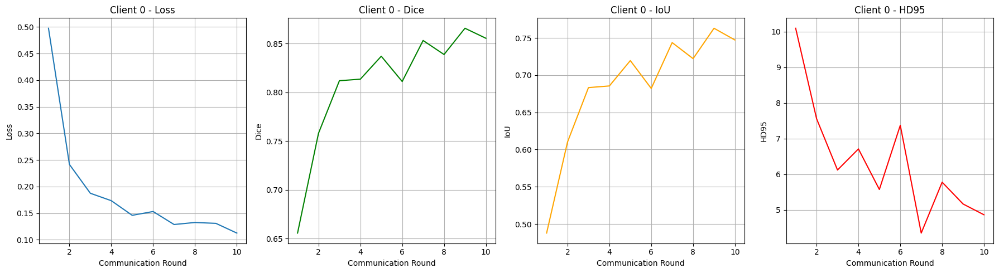

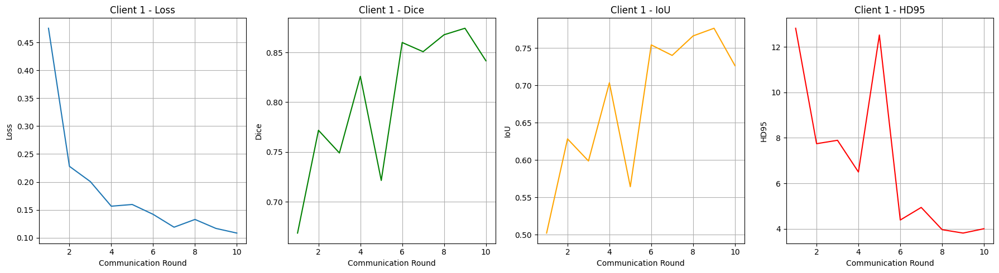

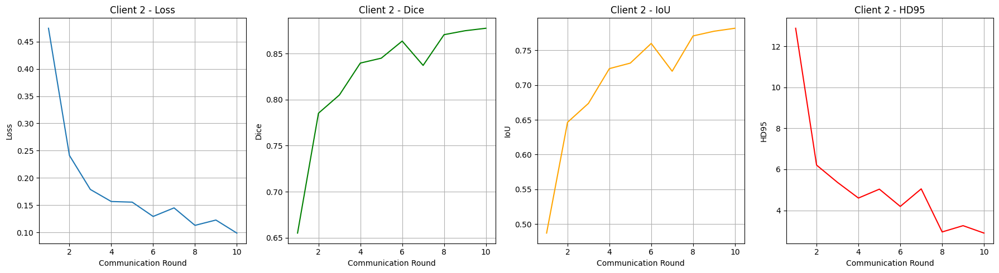

In [21]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

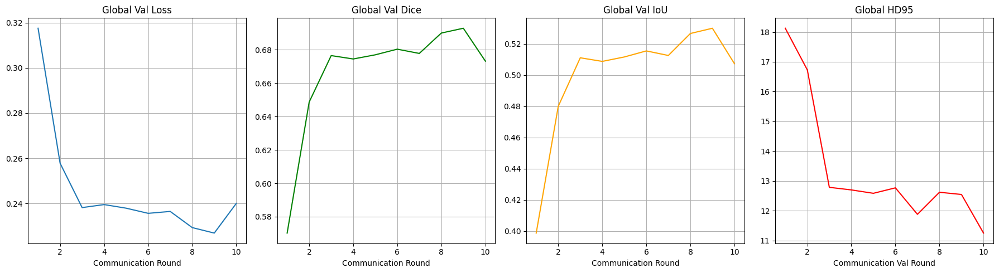

In [22]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [23]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB\AppData\Local\Temp\ipykernel_20112\1367524147.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth")


Test samples: 50
Factorizer(
  (stem): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  (encoder): UNetEncoder(
    (blocks): ModuleList(
      (0): UNetEncoderBlock(
        (downsample): Identity()
        (block): FactorizerStage(
          (pos_embed): Identity()
          (blocks): ModuleList(
            (0): FactorizerBlock(
              (norm1): LayerNorm(
                (norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
              )
              (fact): FactMixer(
                (in_proj): Linear(
                  (flatten): Flatten(start_dim=2, end_dim=-1)
                  (linear): Conv1d(32, 32, kernel_size=(1,), stride=(1,), bias=False)
                )
                (reshape): SWMatricize(
                  (shifted_windows): ModuleList(
                    (0-1): 2 x Matricize(
                      (rearrange): Rearrange('b (h d) (g0 p0) (g1 p1) (g2 p2) -> (b h) (g0 g1 g2) d (p0 p1 p2)', d=8, p0=2, p1=2, p2=2)

Testing:  54%|█████▍    | 27/50 [00:05<00:04,  4.83it/s, Dice=0.5845, IoU=0.4129, HD95=14.7716]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s, Dice=0.6494, IoU=0.4808, HD95=12.0627]


Test Set Metrics:
Dice: 0.6494
IoU: 0.4808
HD95: 12.0627


**Visualize**

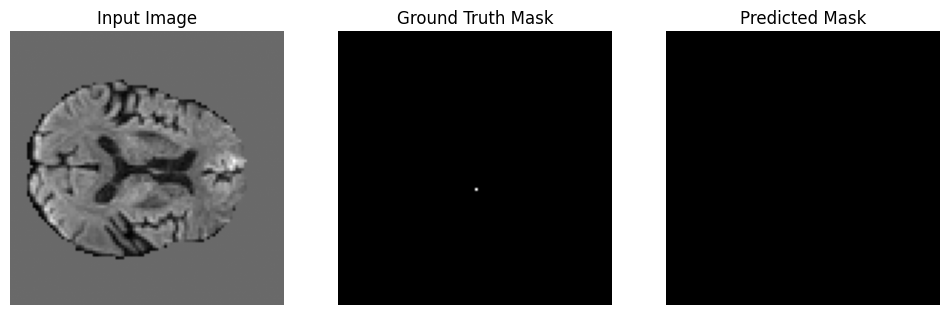

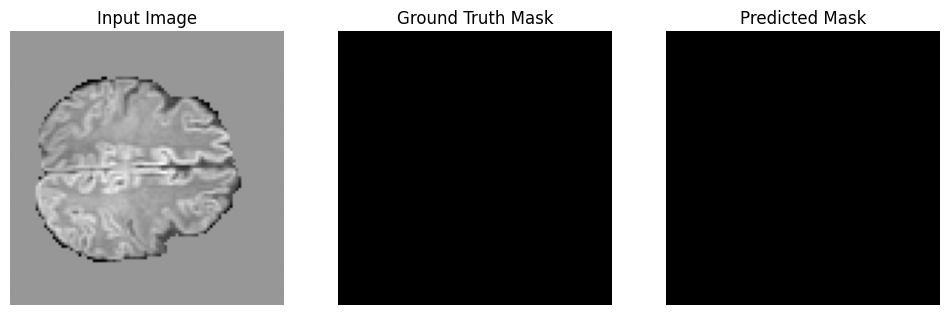

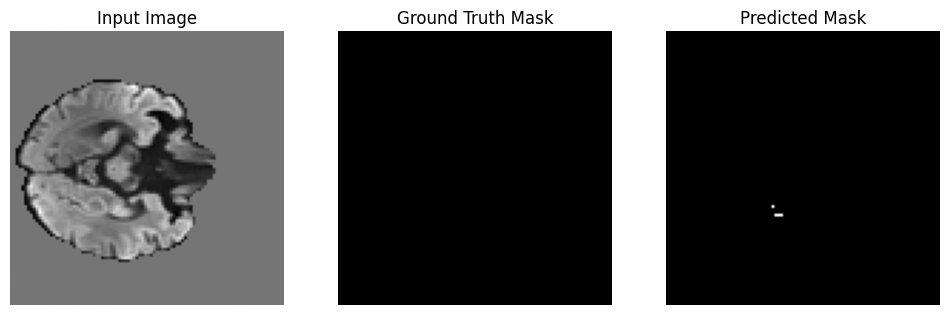

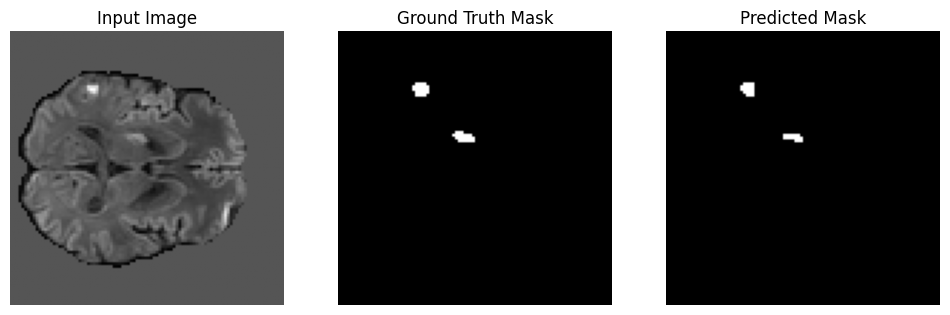

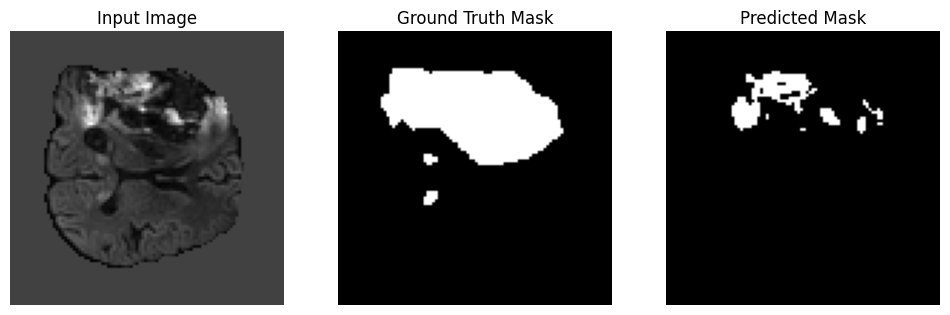

...

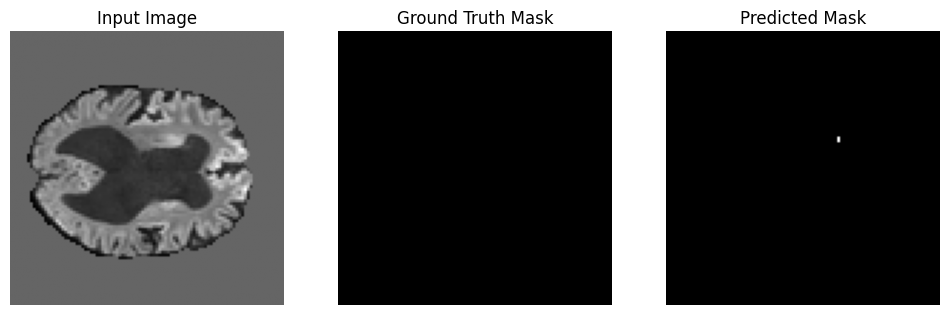

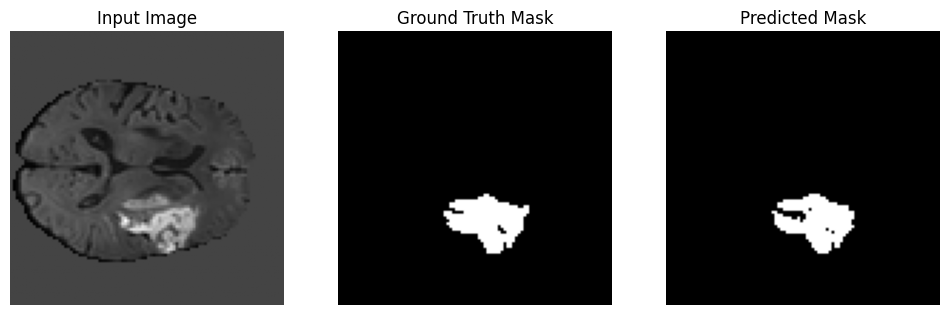

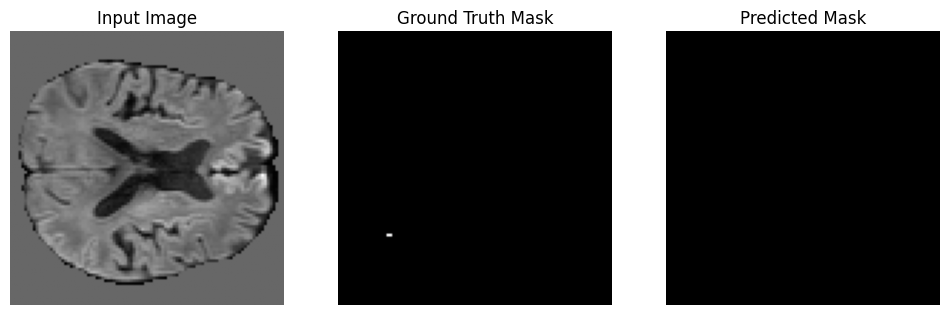

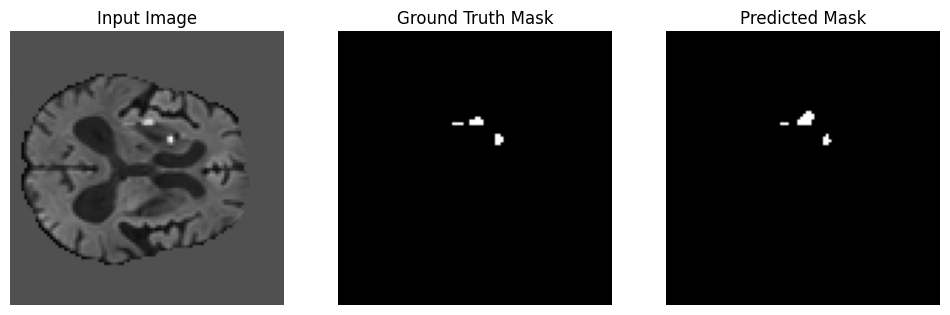

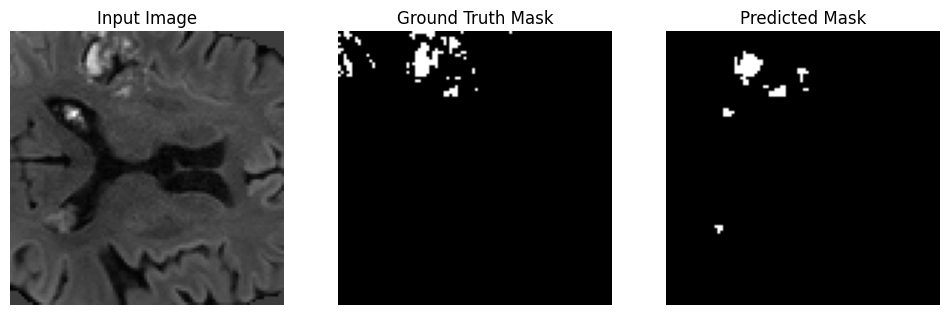

In [24]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()